In [ ]:
%matplotlib inline
import ipfix, qof, imp
import pandas as pd
import numpy as np
import load

# directories
input_dir  = "/mnt/data/mami/copycat/"
output_dir = "/home/ko/Desktop/2016/MAMI/copycat/plots/"

# 53 & 443 are often already bound on PL
ports  = [53, 443, 8008, 12345, 33435, 34567, 54321]
ports2 = [8008, 12345, 33435, 34567, 54321]
sizes = {4096 : '4KB', 12288 : '13KB', 
         122880 : '130KB', 1228800 : '1.2MB', 
         6144000 : '6MB'}
files = ["planetlab.ipfix"]
tmplt = ("sourceIPv4Address","destinationIPv4Address", "destinationTransportPort", 
         "flowStartMilliseconds","flowEndMilliseconds","reverseFlowDeltaMilliseconds",
         "sourceTransportPort","protocolIdentifier", "packetDeltaCount",
         "reversePacketDeltaCount","octetDeltaCount","reverseOctetDeltaCount",
         "transportOctetDeltaCount","reverseTransportOctetDeltaCount","transportPacketDeltaCount",
         "reverseTransportPacketDeltaCount","tcpSequenceCount","reverseTcpSequenceCount",
         "tcpSequenceLossCount","reverseTcpSequenceLossCount",
         "copycatCampaignId", "copycatFileSize", "copycatRunId"
        )

# load planetlab data
diff, tcp, udp = load.load_df(input_dir, files, tmplt, ports)

# load atlas and ark/do data
rtt_do4 = pd.read_csv(input_dir+"rtt/do-rtt4.csv")
rtt_do6 = pd.read_csv(input_dir+"rtt/do-rtt6.csv")
t_do4 = pd.read_csv(input_dir+"rtt/do-bw4.csv")
t_do6 = pd.read_csv(input_dir+"rtt/do-bw6.csv")
rtt_atlas = pd.read_csv(input_dir+"rtt/atlas-rtt.csv")
rtt_atlas["rtt_adiff"]  = rtt_atlas.TCP_TR_med_rtt - rtt_atlas.UDP_TR_med_rtt
rtt_atlas["rtt_rdiff"]  = (rtt_atlas.TCP_TR_med_rtt - rtt_atlas.UDP_TR_med_rtt) / (pd.DataFrame([rtt_atlas.TCP_TR_med_rtt, rtt_atlas.UDP_TR_med_rtt]).min())

In [6]:
diff

,sourceIPv4Address,destinationIPv4Address,destinationTransportPort,copycatRunId,copycatFileSize,copycatCampaignId,tcp_rtt,udp_rtt,rtt_adiff,rtt_rdiff,tcp_bw,udp_bw,bw_adiff,bw_rdiff,tcp_loss,udp_loss,loss_adiff
0,18,34,443,4,4096,00009,40,40.0,0.0,0.000000,3.357377e+04,3.532800e+04,1.754230e+03,0.052250,0.000000,0.0,0.000000
1,26,28,443,4,4096,00009,43,44.0,-1.0,-0.023256,3.103030e+04,3.295522e+04,1.924921e+03,0.062034,0.000000,0.0,0.000000
2,26,87,443,4,4096,00009,108,108.0,0.0,0.000000,1.260308e+04,1.358769e+04,9.846154e+02,0.078125,0.000000,0.0,0.000000
3,26,25,443,4,4096,00009,15,15.0,0.0,0.000000,8.904348e+04,1.026977e+05,1.365420e+04,0.153343,0.000000,0.0,0.000000
4,26,142,443,4,4096,00009,232,237.0,-5.0,-0.021552,5.876614e+03,6.281650e+03,4.050360e+02,0.068923,0.000000,0.0,0.000000
5,45,87,443,4,4096,00009,116,116.0,0.0,0.000000,1.173639e+04,1.254545e+04,8.090649e+02,0.068936,0.000000,0.0,0.000000
6,34,0,443,4,4096,00009,64,106.0,-42.0,-0.656250,4.858837e+03,4.775345e+03,-8.349280e+01,-0.017484,0.000000,0.0,0.000000
7,10,44,443,4,4096,00009,84,85.0,-1.0,-0.011905,1.618972e+04,1.725000e+04,1.060277e+03,0.065491,0.000000,0.0,0.000000
8,72,73,443,4,4096,00009,4,3.0,1.0,0.333333,2.048000e+05,1.472000e+05,-5.760000e+04,-0.391304,0.000000,0.0,0.000000
9,45,121,443,4,4096,00009,348,349.0,-1.0,-0.002874,3.867800e+03,4.169972e+03,3.021719e+02,0.078125,0.000000,0.0,0.000000


# RTT

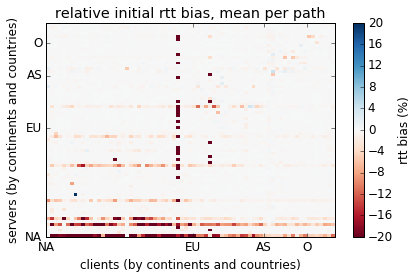

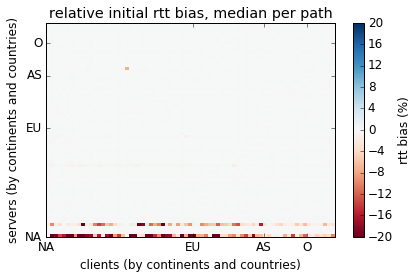

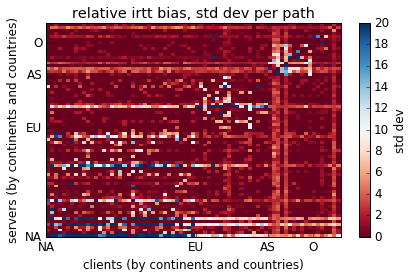

In [8]:
from graph import *

save = False
fmt = "pdf"
cmap = "RdBu"
    
_=diff_grid(diff, "rtt_rdiff", np.mean, "mean", "relative initial rtt bias, mean per path", 
          vrange=[-20,20], zlegend="rtt bias (%)", cmap=cmap, 
          file=output_dir+"irtt-rdiff-mean."+fmt if save else None)
_=diff_grid(diff, "rtt_rdiff", np.median, "median", "relative initial rtt bias, median per path", 
          vrange=[-20,20], zlegend="rtt bias (%)", cmap=cmap,
          file=output_dir+"irtt-rdiff-median."+fmt if save else None)
_=diff_grid(diff, "rtt_rdiff", np.std, "std", "relative irtt bias, std dev per path", 
          vrange=[0,20], zlegend="std dev", cmap=cmap,
          file=output_dir+"irtt-rdiff-stddev."+fmt if save else None)


port 8008
TCP RTT, mean runs, mean nodes = 198.426481654
UDP RTT, mean runs, mean nodes = 253.790371525
total diff mean RTT = -51.82


port 12345
TCP RTT, mean runs, mean nodes = 200.529167661
UDP RTT, mean runs, mean nodes = 262.068474306
total diff mean RTT = -42.67


port 33435
TCP RTT, mean runs, mean nodes = 202.821986294
UDP RTT, mean runs, mean nodes = 250.437229049
total diff mean RTT = -46.67


port 34567
TCP RTT, mean runs, mean nodes = 207.148997893
UDP RTT, mean runs, mean nodes = 250.346522991
total diff mean RTT = -42.43


port 54321
TCP RTT, mean runs, mean nodes = 204.482631149
UDP RTT, mean runs, mean nodes = 262.292135407
total diff mean RTT = -56.80



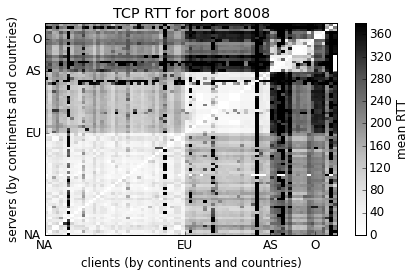

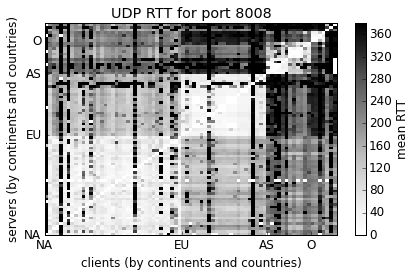

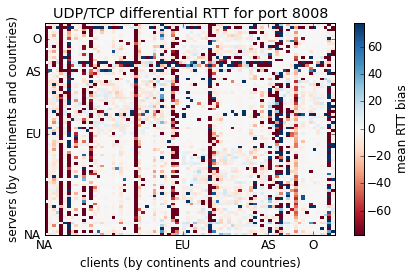

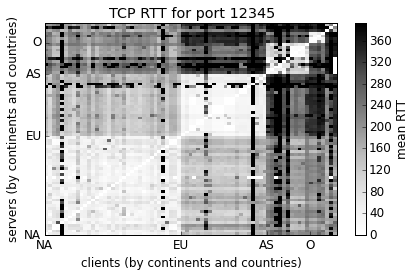

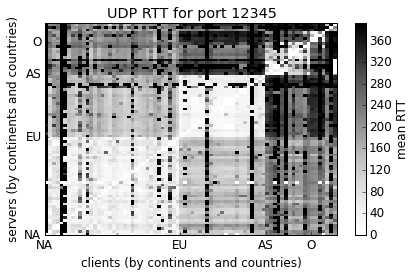

...

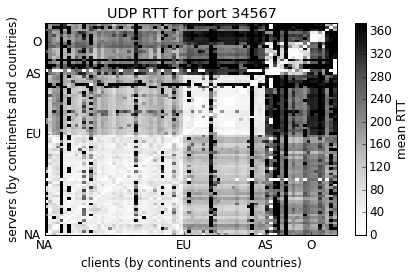

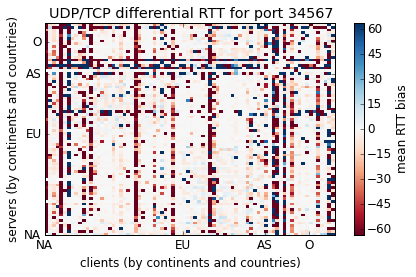

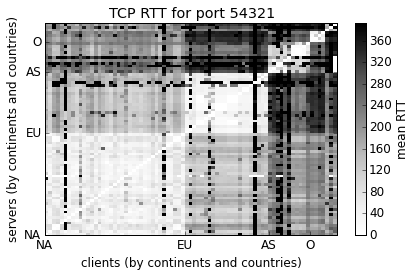

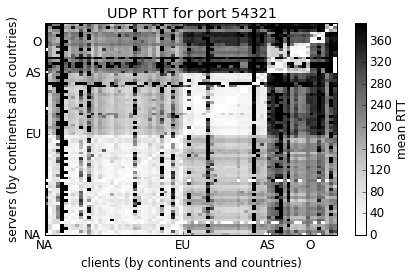

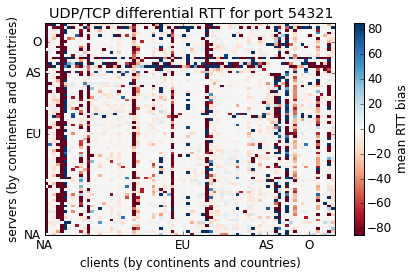

In [116]:
graph.agg(tcp, udp, np.mean, "mean", "reverseFlowDeltaMilliseconds", ports=ports2, cmap1="Greys", cmap2="RdBu")


port 8008
TCP RTT, amin runs, mean nodes = 140.292901335
UDP RTT, amin runs, mean nodes = 160.021927671
total diff amin RTT = -16.77


port 12345
TCP RTT, amin runs, mean nodes = 143.474416923
UDP RTT, amin runs, mean nodes = 156.085915257
total diff amin RTT = -11.79


port 33435
TCP RTT, amin runs, mean nodes = 141.876329576
UDP RTT, amin runs, mean nodes = 156.437131631
total diff amin RTT = -14.35


port 34567
TCP RTT, amin runs, mean nodes = 142.37787262
UDP RTT, amin runs, mean nodes = 153.110547667
total diff amin RTT = -10.54


port 54321
TCP RTT, amin runs, mean nodes = 140.399245412
UDP RTT, amin runs, mean nodes = 165.57515528
total diff amin RTT = -24.94



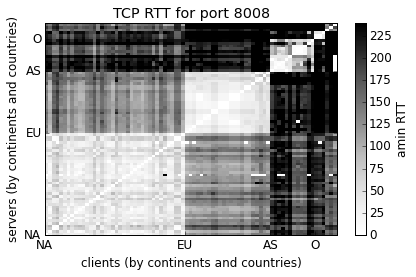

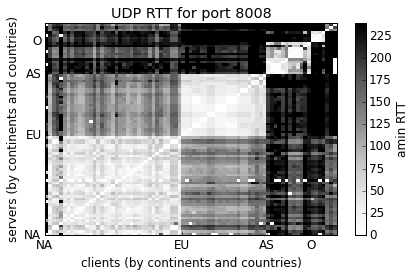

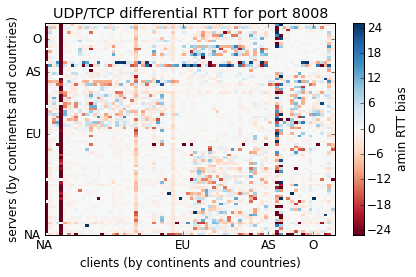

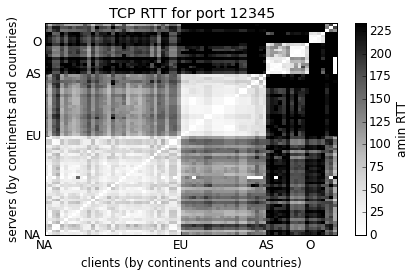

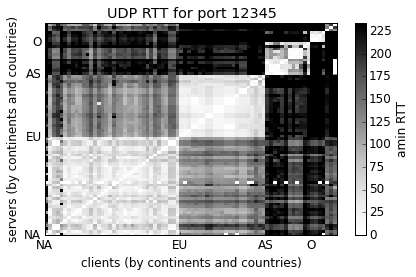

...

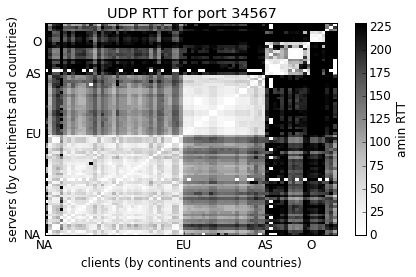

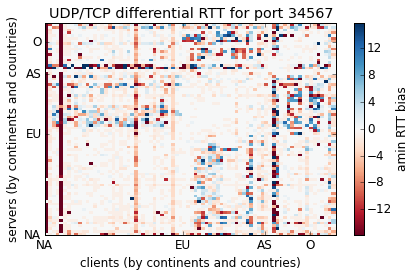

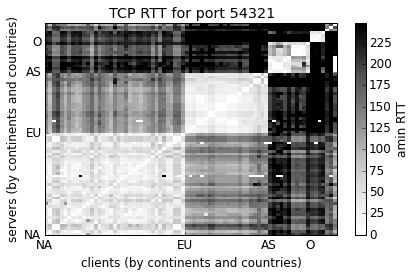

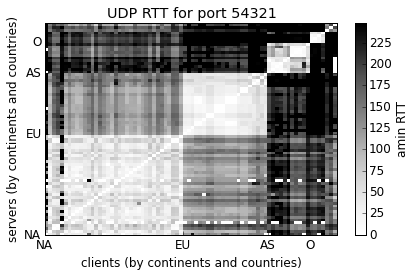

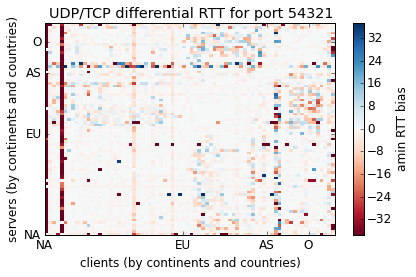

In [117]:
graph.agg(tcp, udp, np.min, "amin", "reverseFlowDeltaMilliseconds", ports=ports2, cmap1="Greys", cmap2="RdBu")


port 8008
TCP RTT, median runs, mean nodes = 156.555763595
UDP RTT, median runs, mean nodes = 195.657339224
total diff median RTT = -36.62


port 12345
TCP RTT, median runs, mean nodes = 159.234044477
UDP RTT, median runs, mean nodes = 197.648802546
total diff median RTT = -23.08


port 33435
TCP RTT, median runs, mean nodes = 161.884902365
UDP RTT, median runs, mean nodes = 192.457023576
total diff median RTT = -30.56


port 34567
TCP RTT, median runs, mean nodes = 157.423424163
UDP RTT, median runs, mean nodes = 185.531102096
total diff median RTT = -27.77


port 54321
TCP RTT, median runs, mean nodes = 158.990481907
UDP RTT, median runs, mean nodes = 205.484560781
total diff median RTT = -46.01



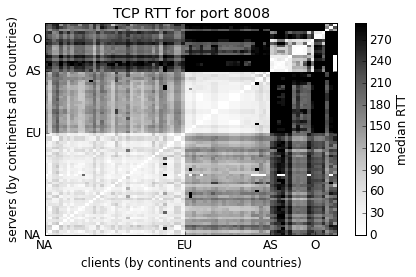

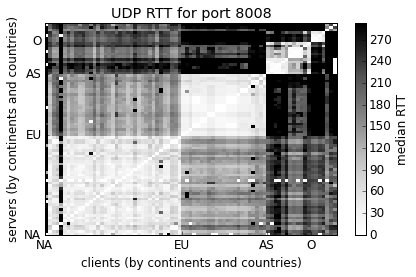

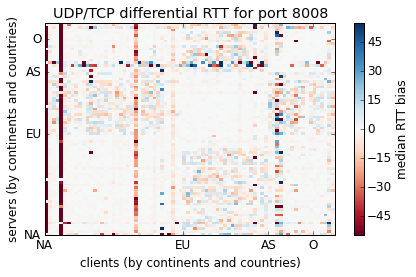

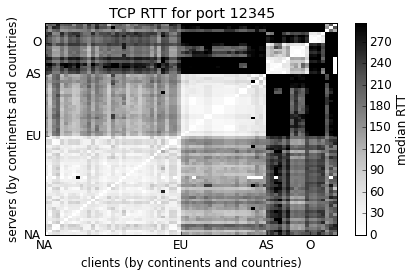

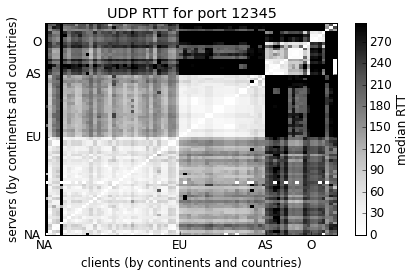

...

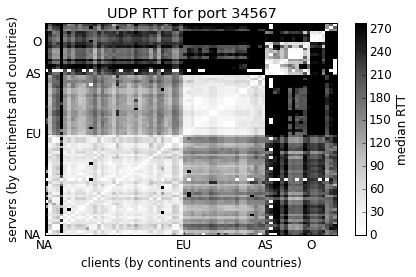

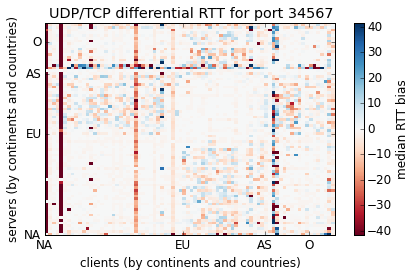

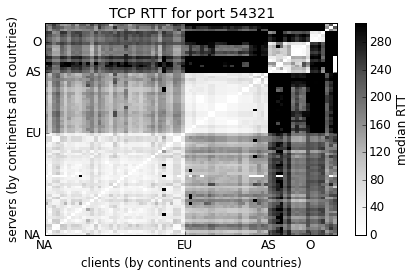

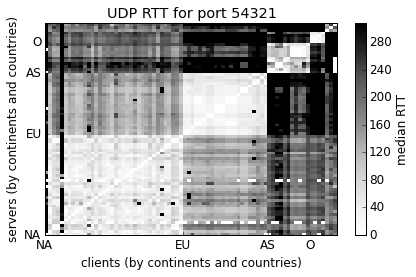

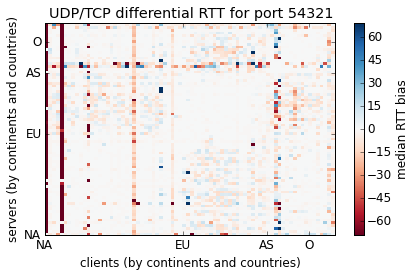

In [118]:
graph.agg(tcp, udp, np.median, "median", "reverseFlowDeltaMilliseconds", ports=ports2, cmap1="Greys", cmap2="RdBu")


port 8008
TCP RTT, std runs, mean nodes = 120.623796479
UDP RTT, std runs, mean nodes = 190.943259626
total diff std RTT = -65.90


port 12345
TCP RTT, std runs, mean nodes = 123.524655647
UDP RTT, std runs, mean nodes = 199.547976071
total diff std RTT = -58.69


port 33435
TCP RTT, std runs, mean nodes = 125.65624706
UDP RTT, std runs, mean nodes = 186.320770413
total diff std RTT = -56.62


port 34567
TCP RTT, std runs, mean nodes = 141.197881539
UDP RTT, std runs, mean nodes = 197.535798727
total diff std RTT = -54.06


port 54321
TCP RTT, std runs, mean nodes = 130.761535978
UDP RTT, std runs, mean nodes = 184.424741439
total diff std RTT = -51.05



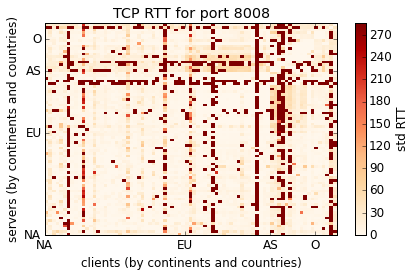

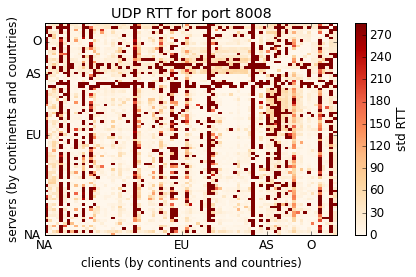

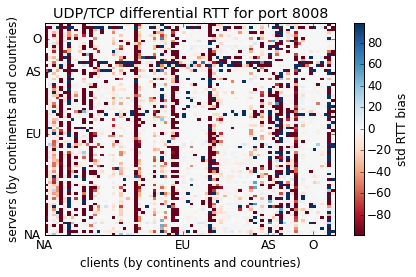

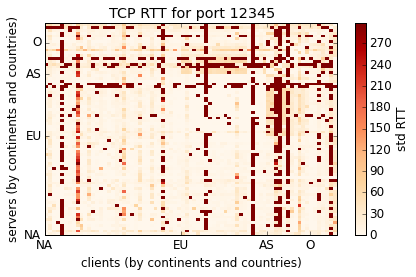

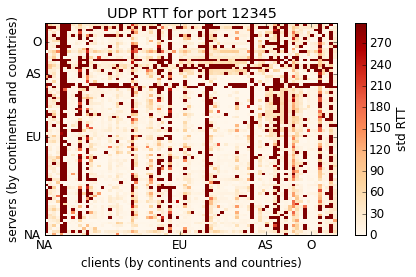

...

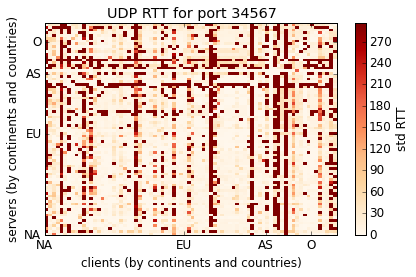

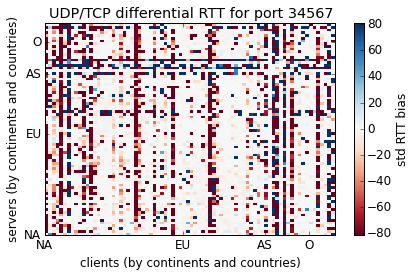

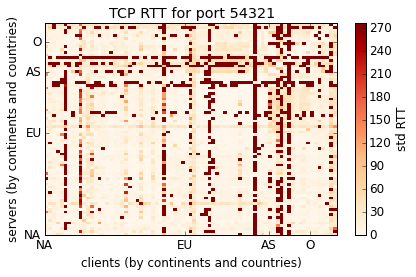

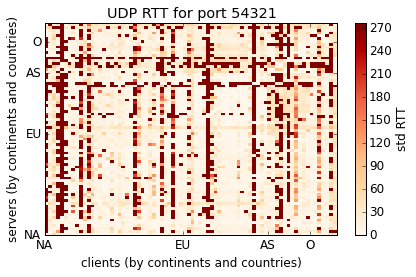

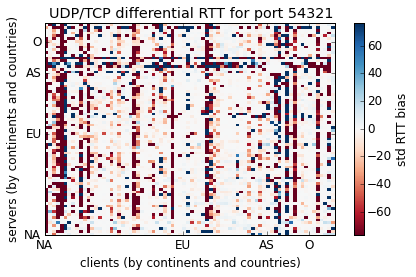

In [119]:
graph.agg(tcp, udp, np.std, "std", "reverseFlowDeltaMilliseconds", ports=ports2, cmap1="OrRd", cmap2="RdBu")

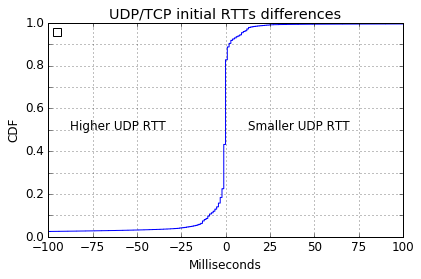

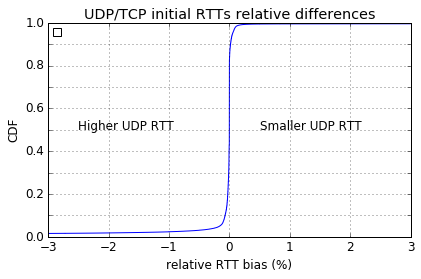

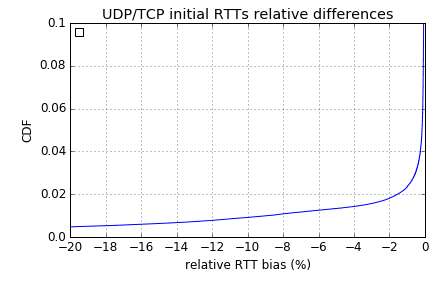

In [14]:
# PlanetLab RTT biases (absolute & relative)
save = False 
fmt = 'pdf'
import graph
imp.reload(graph)
from graph import *
# absolute rtt difference
clip_at = 100
this_clipped_diff = diff["rtt_adiff"].clip(-clip_at, clip_at)
_=cdf(this_clipped_diff, "UDP/TCP initial RTTs differences", "Milliseconds", "CDF", 
          output_dir+"/irtt-adiff-cdf.{}".format(fmt) if save else None, num=1000000,
          ann=[("Higher UDP RTT",(-87.5,.5)),("Smaller UDP RTT",(12.5,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,25),
          yticks=np.arange(0,101,10)/100, 
          ytickslabel=[str(e/100) if (e%20==0) else "" for e in range(0,101,10)])

# relative rtt difference
clip_at = 3
this_clipped_diff = diff["rtt_rdiff"].clip(-clip_at, clip_at)
_=cdf(this_clipped_diff, "UDP/TCP initial RTTs relative differences", "relative RTT bias (%)", "CDF", 
          output_dir+"/irtt-rdiff-cdf.{}".format(fmt) if save else None, num=10000,
          ann=[("Higher UDP RTT",(-2.5,.5)),("Smaller UDP RTT",(0.5,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,1),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)])

# zoom in
clip_at = 20
this_clipped_diff = diff["rtt_rdiff"].clip(-clip_at, clip_at)
_=cdf(this_clipped_diff, "UDP/TCP initial RTTs relative differences", "relative RTT bias (%)", "CDF", 
          None, num=10000,
          ann=[("Higher UDP RTT",(-2.5,.5)),("Smaller UDP RTT",(0.5,.5))], font_size=12,
          xticks=np.arange(-clip_at,1,2), xlim=(-20,0),
          yticks=np.arange(0,11,2)/100.0, ylim=(0,0.1),
          ytickslabel=[str(e/100) if (e%2==0) else "" for e in range(0,11,2)])


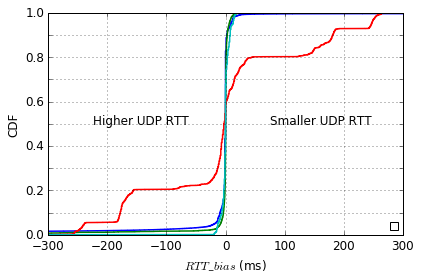

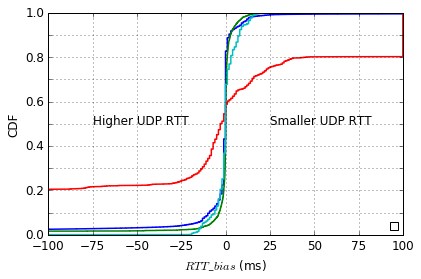

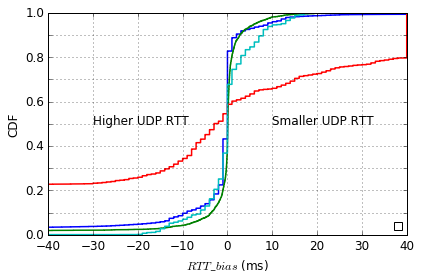

In [15]:
# absolute rtt bias
import graph
save = False
fmt = 'pdf'

clip_at = 300

clipped_pl    = diff["rtt_adiff"].clip(-clip_at, clip_at)
clipped_do4   = rtt_do4["rtt_adiff"].clip(-clip_at, clip_at)
clipped_do6   = rtt_do6["rtt_adiff"].clip(-clip_at, clip_at)
clipped_atlas = rtt_atlas["rtt_adiff"].clip(-clip_at, clip_at)

data = [clipped_pl,clipped_atlas, clipped_do4,  clipped_do6]
_=graph.cdf(data, "", "$RTT\_bias$ (ms)", "CDF", 
          output_dir+"/irtt-adiff-cdf.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "Atlas", "DO IPv4", "DO IPv6"], 
          linestyles=["solid","solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g', 'r', 'c'], legendloc=4,
          ann=[("Higher UDP RTT",(-0.75*clip_at,.5)),("Smaller UDP RTT",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,100),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)

clip_at = 100

clipped_pl    = diff["rtt_adiff"].clip(-clip_at, clip_at)
clipped_do4   = rtt_do4["rtt_adiff"].clip(-clip_at, clip_at)
clipped_do6   = rtt_do6["rtt_adiff"].clip(-clip_at, clip_at)
clipped_atlas = rtt_atlas["rtt_adiff"].clip(-clip_at, clip_at)

data = [clipped_pl,clipped_atlas, clipped_do4,  clipped_do6]
_=graph.cdf(data, "", "$RTT\_bias$ (ms)", "CDF", 
          output_dir+"/irtt-adiff-cdf2.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "Atlas", "DO IPv4", "DO IPv6"], 
          linestyles=["solid","solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g', 'r', 'c'], legendloc=4,
          ann=[("Higher UDP RTT",(-0.75*clip_at,.5)),("Smaller UDP RTT",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,25),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)

clip_at = 40

clipped_pl    = diff["rtt_adiff"].clip(-clip_at, clip_at)
clipped_do4   = rtt_do4["rtt_adiff"].clip(-clip_at, clip_at)
clipped_do6   = rtt_do6["rtt_adiff"].clip(-clip_at, clip_at)
clipped_atlas = rtt_atlas["rtt_adiff"].clip(-clip_at, clip_at)

data = [clipped_pl,clipped_atlas, clipped_do4,  clipped_do6]
_=graph.cdf(data, "", "$RTT\_bias$ (ms)", "CDF", 
          output_dir+"/irtt-adiff-cdf3.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "Atlas", "DO IPv4", "DO IPv6"], 
          linestyles=["solid","solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g', 'r', 'c'], legendloc=4,
          ann=[("Higher UDP RTT",(-0.75*clip_at,.5)),("Smaller UDP RTT",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,10),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)

745947 96.21%
29370 3.79%
< -50 ms: 24699 (84.10%) > 50 ms 4671 (15.90%)

2669 98.23%
48 1.77%
< -50 ms: 48 (100.00%) > 50 ms 0 (0.00%)

8099 57.91%
5887 42.09%
< -50 ms: 3113 (52.88%) > 50 ms 2774 (47.12%)

12401 99.83%
21 0.17%
< -50 ms: 10 (47.62%) > 50 ms 11 (52.38%)



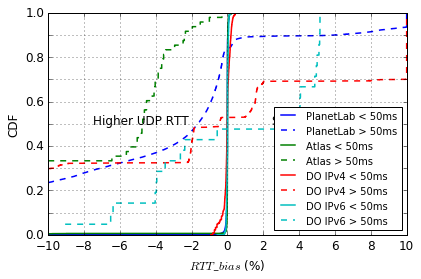

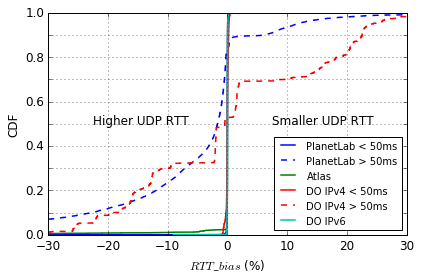

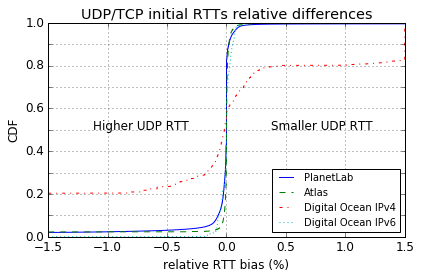

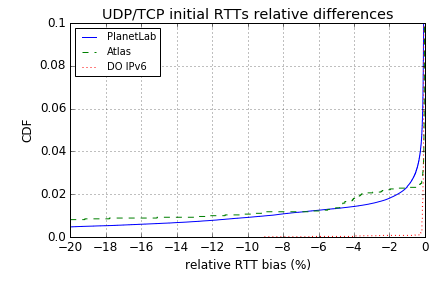

In [20]:
import graph
save = False
fmt = 'pdf'
imp.reload(graph)

# clip outliers
clip_at = 10
split_at = 50
clipped_pl_low     = diff[(diff.rtt_adiff > -split_at) & 
                          (diff.rtt_adiff < split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[(diff.rtt_adiff <= -split_at) | 
                          (diff.rtt_adiff >= split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do4_low    = rtt_do4[(rtt_do4.rtt_adiff > -split_at) & 
                             (rtt_do4.rtt_adiff < split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do4_high    = rtt_do4[(rtt_do4.rtt_adiff <= -split_at) | 
                              (rtt_do4.rtt_adiff >= split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do6_low    = rtt_do6[(rtt_do6.rtt_adiff > -split_at) & 
                             (rtt_do6.rtt_adiff < split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do6_high    = rtt_do6[(rtt_do6.rtt_adiff <= -split_at) | 
                              (rtt_do6.rtt_adiff >= split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_atlas_low = rtt_atlas[(rtt_atlas.rtt_adiff > -split_at) & 
                              (rtt_atlas.rtt_adiff < split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_atlas_high = rtt_atlas[(rtt_atlas.rtt_adiff <= -split_at) | 
                               (rtt_atlas.rtt_adiff >= split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)

data = [clipped_pl_low,clipped_pl_high,clipped_atlas_low, clipped_atlas_high,  
             clipped_do4_low, clipped_do4_high,  clipped_do6_low, clipped_do6_high]
for i,d in enumerate(data):
    items=len(d)
    if i<=1:
        rate=items/len(diff)
    elif i<=3:
        rate=items/len(rtt_atlas)
    elif i<=5:
        rate=items/len(rtt_do4)
    elif i<=7:
        rate=items/len(rtt_do6)
        
    print("{0} {1:.2f}%".format(items, rate*100.0 ))
    if i ==1:
        print("< -50 ms: {0} ({2:.2f}%) > 50 ms {1} ({3:.2f}%)\n".format(
                       len(diff[diff.rtt_adiff <= -split_at]),  
                       len(diff[diff.rtt_adiff >= split_at]),
                       (len(diff[diff.rtt_adiff <= -split_at])/float(items))*100.0,  
                       (len(diff[diff.rtt_adiff >= split_at])/float(items))*100.0))
    elif i ==3:
        print("< -50 ms: {0} ({2:.2f}%) > 50 ms {1} ({3:.2f}%)\n".format(
                       len(rtt_atlas[rtt_atlas.rtt_adiff <= -split_at]),  
                       len(rtt_atlas[rtt_atlas.rtt_adiff >= split_at]),
                       (len(rtt_atlas[rtt_atlas.rtt_adiff <= -split_at])/float(items))*100.0,  
                       (len(rtt_atlas[rtt_atlas.rtt_adiff >= split_at])/float(items))*100.0))
    elif i ==5:
        print("< -50 ms: {0} ({2:.2f}%) > 50 ms {1} ({3:.2f}%)\n".format(
                       len(rtt_do4[rtt_do4.rtt_adiff <= -split_at]),  
                       len(rtt_do4[rtt_do4.rtt_adiff >= split_at]),
                       (len(rtt_do4[rtt_do4.rtt_adiff <= -split_at])/float(items))*100.0,  
                       (len(rtt_do4[rtt_do4.rtt_adiff >= split_at])/float(items))*100.0))                                  
    elif i ==7:
        print("< -50 ms: {0} ({2:.2f}%) > 50 ms {1} ({3:.2f}%)\n".format(
                       len(rtt_do6[rtt_do6.rtt_adiff <= -split_at]),  
                       len(rtt_do6[rtt_do6.rtt_adiff >= split_at]),
                       (len(rtt_do6[rtt_do6.rtt_adiff <= -split_at])/float(items))*100.0,  
                       (len(rtt_do6[rtt_do6.rtt_adiff >= split_at])/float(items))*100.0))                                     
        
    
# UDP/TCP initial RTTs relative differences
_=graph.cdf(data, "", "$RTT\_bias$ (%)", "CDF", 
          output_dir+"/irtt-rdiff-cdf.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab < 50ms","PlanetLab > 50ms", "Atlas < 50ms", "Atlas > 50ms", 
                  "DO IPv4 < 50ms",  "DO IPv4 > 50ms", "DO IPv6 < 50ms" , "DO IPv6 > 50ms"], 
          linestyles=["solid","dashed","solid", "dashed", "solid", "dashed" ,"solid", "dashed"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'b', 'g', 'g', 'r', 'r', 'c', 'c'], legendloc=4,
          ann=[("Higher UDP RTT",(-0.75*clip_at,.5)),("Smaller UDP RTT",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,2),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)


clip_at = 30
split_at = 50

clipped_pl_low     = diff[(diff.rtt_adiff > -split_at) & 
                          (diff.rtt_adiff < split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[(diff.rtt_adiff <= -split_at) | 
                          (diff.rtt_adiff >= split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do4_low    = rtt_do4[(rtt_do4.rtt_adiff > -split_at) & 
                             (rtt_do4.rtt_adiff < split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do4_high    = rtt_do4[(rtt_do4.rtt_adiff <= -split_at) | 
                              (rtt_do4.rtt_adiff >= split_at)]["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do6    = rtt_do6["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_atlas = rtt_atlas["rtt_rdiff"].clip(-clip_at, clip_at)

data = [clipped_pl_low,clipped_pl_high,clipped_atlas,  
             clipped_do4_low, clipped_do4_high,  clipped_do6]
_=graph.cdf(data, "", "$RTT\_bias$ (%)", "CDF", 
          output_dir+"/irtt-rdiff-cdf-filtered.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab < 50ms","PlanetLab > 50ms", "Atlas", 
                  "DO IPv4 < 50ms",  "DO IPv4 > 50ms", "DO IPv6"], 
          linestyles=["solid","dashed","solid", "solid", "dashed" ,"solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'b', 'g', 'r', 'r', 'c'], legendloc=4,
          ann=[("Higher UDP RTT",(-0.75*clip_at,.5)),("Smaller UDP RTT",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,10),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)

clip_at = 1.5
clipped_pl    = diff["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do4    = rtt_do4["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do6    = rtt_do6["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_atlas = rtt_atlas["rtt_rdiff"].clip(-clip_at, clip_at)


_=graph.cdf([clipped_pl,clipped_atlas,  clipped_do4, clipped_do6], "UDP/TCP initial RTTs relative differences", 
            "relative RTT bias (%)", "CDF", 
          output_dir+"/irtt-rdiff-cdf-zoomed.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "Atlas", "Digital Ocean IPv4", "Digital Ocean IPv6"], 
          linestyles=["solid","dashed","dashdot", "dotted"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g', 'r', 'c'],
          ann=[("Higher UDP RTT",(-0.75*clip_at,.5)),("Smaller UDP RTT",(0.25*clip_at,.5))], font_size=12,
          #xticks=np.arange(-clip_at,clip_at+1,1),
          xticks=[-1.5,-1.0,-0.5,0,0.5,1.0,1.5],legendloc=4,
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)])
# zoom in
clip_at = 20
clipped_pl    = diff["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_do6    = rtt_do6["rtt_rdiff"].clip(-clip_at, clip_at)
clipped_atlas = rtt_atlas["rtt_rdiff"].clip(-clip_at, clip_at)
this_clipped_diff = diff["rtt_rdiff"].clip(-clip_at, clip_at)
_=graph.cdf([clipped_pl, clipped_atlas, clipped_do6], "UDP/TCP initial RTTs relative differences", "relative RTT bias (%)", "CDF", 
          output_dir+"/irtt-zoom.png" if save else None, num=10000,labels=["PlanetLab", "Atlas", "DO IPv6"], 
      linestyles=["solid","dashed", "dotted"],
          colors=['b', 'g', 'r'],
          ann=[("Smaller UDP RTT",(-2.5,.5)),("Higher UDP RTT",(0.5,.5))], font_size=12,
          xticks=np.arange(-clip_at,1,2), xlim=(-20,0),
          yticks=np.arange(0,11,2)/100.0, ylim=(0,0.1),
          ytickslabel=[str(e/100) if (e%2==0) else "" for e in range(0,11,2)])

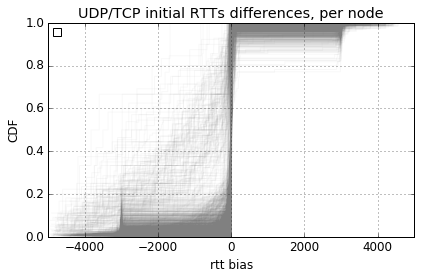

In [21]:
# plot one CDF per path of rtt absolute bias
ind = ["sourceIPv4Address", "destinationIPv4Address"]
ies = ind + ["rtt_adiff"]
dists = diff.reset_index()[ies]
dists = list(dists.groupby(ind)["rtt_adiff"].apply(lambda x: x.tolist()))

_=cdf(dists, "UDP/TCP initial RTTs differences, per node", 
            "rtt bias", "CDF", None,  font_size=12,
            num=1000,alpha=0.05, colors=["grey"]*len(dists), xlim=(-5000,5000))


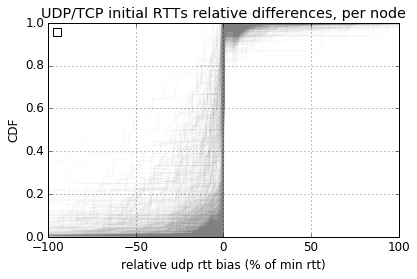

In [22]:
# plot one CDF per path of rtt relative bias
ind = ["sourceIPv4Address", "destinationIPv4Address"]
ies = ind + ["rtt_rdiff"]
dists = diff.reset_index()[ies]
dists = dists.groupby(ind)["rtt_rdiff"].apply(lambda x: x.tolist())

_=cdf(list(dists), "UDP/TCP initial RTTs relative differences, per node", 
            "relative udp rtt bias (% of min rtt)", "CDF", None,  font_size=12,
            num=1000,alpha=0.05,color="grey", xlim=(-100,100))


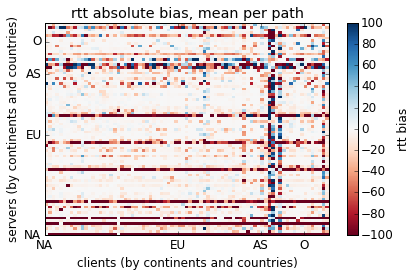

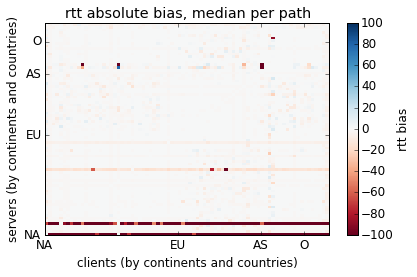

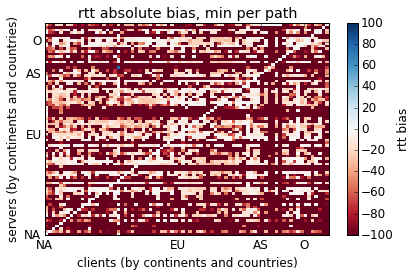

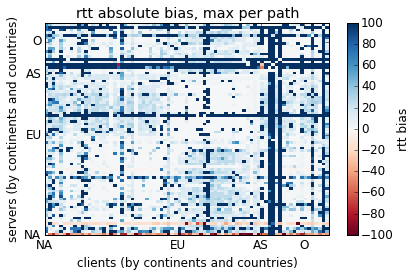

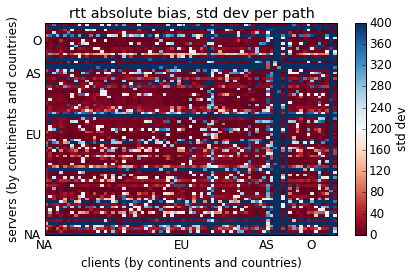

In [37]:
cmap = "RdBu"

diff_grid(diff, "rtt_adiff", np.mean, "mean", "rtt absolute bias, mean per path", cmap=cmap)
diff_grid(diff, "rtt_adiff", np.median, "median", "rtt absolute bias, median per path", cmap=cmap)
diff_grid(diff, "rtt_adiff", np.min, "amin", "rtt absolute bias, min per path", cmap=cmap)
diff_grid(diff, "rtt_adiff", np.max, "amax", "rtt absolute bias, max per path", cmap=cmap)
diff_grid(diff, "rtt_adiff", np.std, "std", "rtt absolute bias, std dev per path", vrange=[0,400], zlegend="std dev", cmap=cmap)

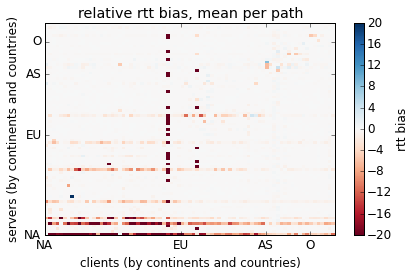

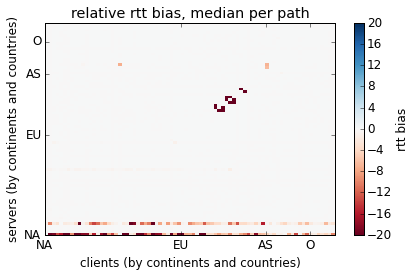

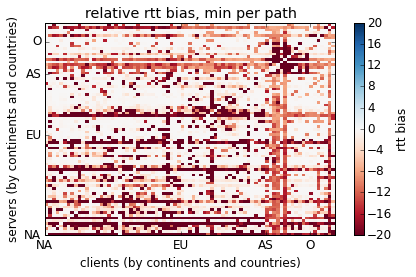

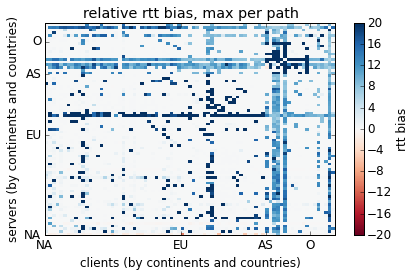

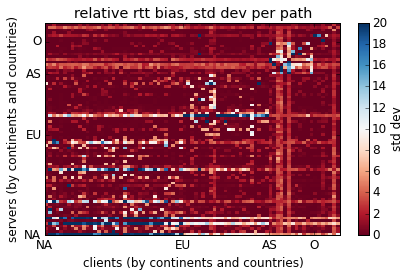

In [38]:
cmap = "RdBu"

diff_grid(diff, "rtt_rdiff", np.mean, "mean", "relative rtt bias, mean per path", vrange=[-20,20], cmap=cmap)
diff_grid(diff, "rtt_rdiff", np.median, "median", "relative rtt bias, median per path", vrange=[-20,20], cmap=cmap)
diff_grid(diff, "rtt_rdiff", np.min, "amin", "relative rtt bias, min per path", vrange=[-20,20], cmap=cmap)
diff_grid(diff, "rtt_rdiff", np.max, "amax", "relative rtt bias, max per path", vrange=[-20,20], cmap=cmap)
diff_grid(diff, "rtt_rdiff", np.std, "std", "relative rtt bias, std dev per path", vrange=[0,20], zlegend="std dev", cmap=cmap)


# Bandwidth

/usr/lib/python3/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


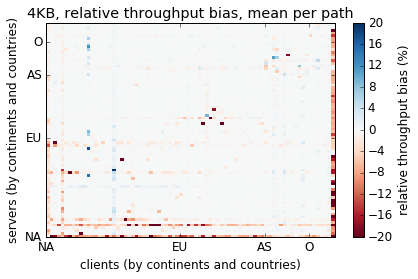

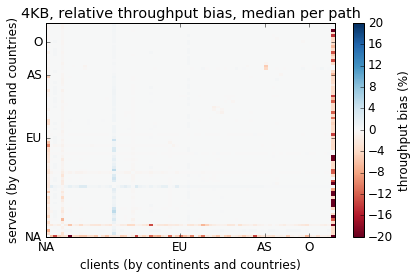

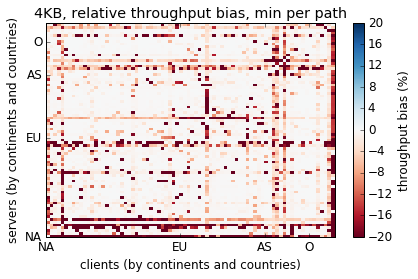

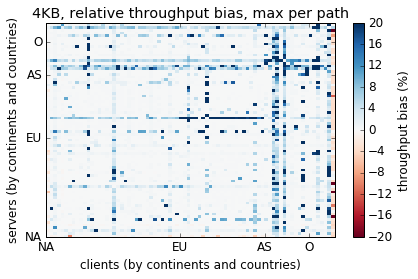

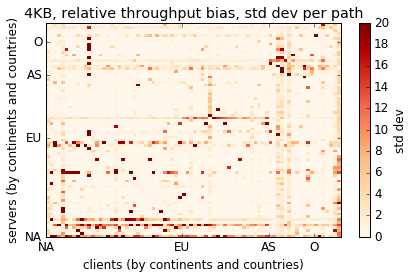

...

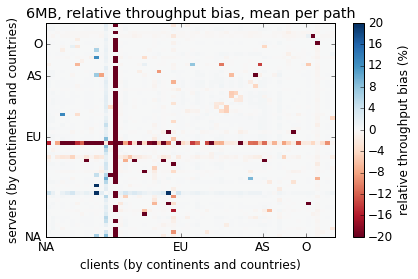

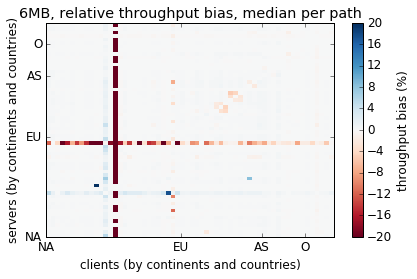

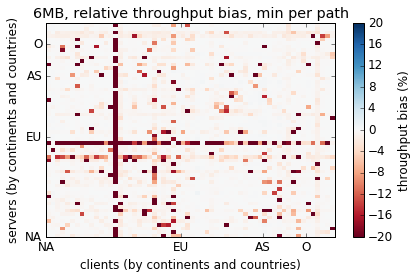

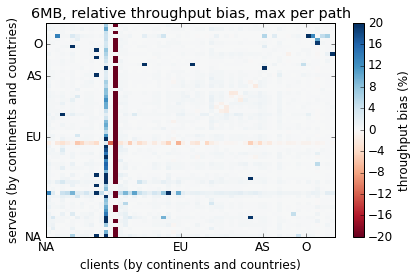

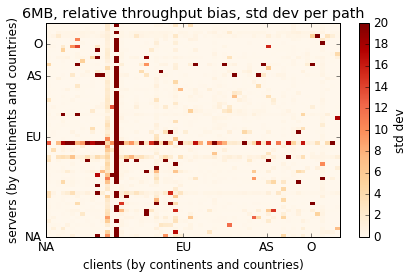

In [25]:
# throughput per flow size

cmap="RdBu"
cmap2="OrRd" # std dev

for size in diff.copycatFileSize.unique():
    this_flowsize = diff[diff.copycatFileSize == size]
    size_label    = sizes[size]
    
    diff_grid(this_flowsize, "bw_rdiff", np.mean, "mean", "{}, relative throughput bias, mean per path".format(size_label), 
              vrange=[-20,20], zlegend="relative throughput bias (%)", cmap=cmap)
    diff_grid(this_flowsize, "bw_rdiff", np.median, "median", "{}, relative throughput bias, median per path".format(size_label), 
              vrange=[-20,20], zlegend="throughput bias (%)", cmap=cmap)
    diff_grid(this_flowsize, "bw_rdiff", np.min, "amin", "{}, relative throughput bias, min per path".format(size_label), 
              vrange=[-20,20], zlegend="throughput bias (%)", cmap=cmap)
    diff_grid(this_flowsize, "bw_rdiff", np.max, "amax", "{}, relative throughput bias, max per path".format(size_label), 
              vrange=[-20,20], zlegend="throughput bias (%)", cmap=cmap)
    diff_grid(this_flowsize, "bw_rdiff", np.std, "std", "{}, relative throughput bias, std dev per path".format(size_label), 
          vrange=[0,20], zlegend="std dev", cmap=cmap2)

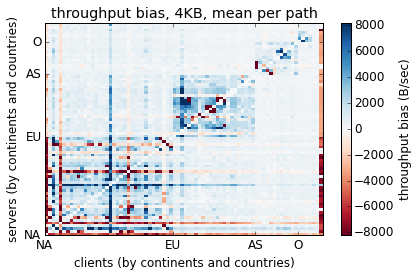

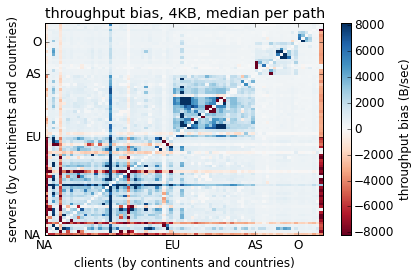

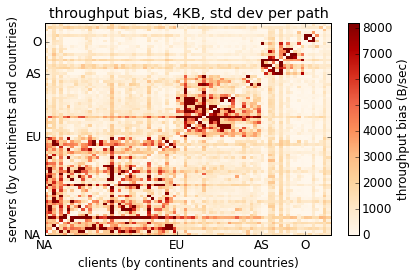

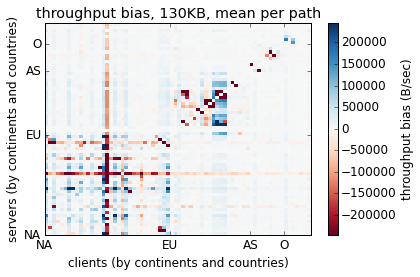

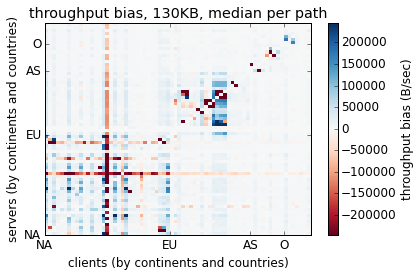

...

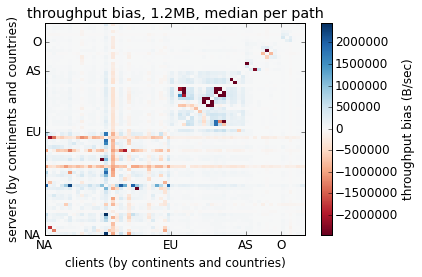

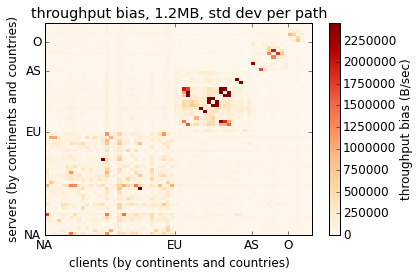

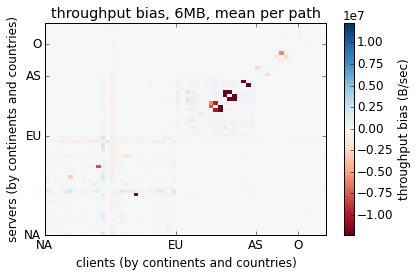

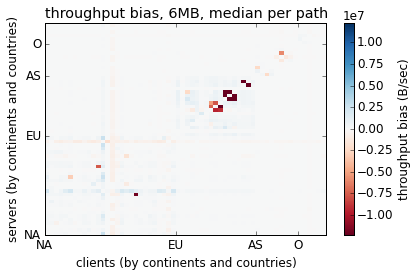

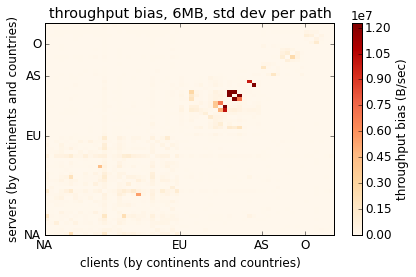

In [49]:
# absolute bias per flowsize


cmap="RdBu"
cmap2="OrRd" # std dev

for size in diff.copycatFileSize.unique():
    this_flowsize = diff[diff.copycatFileSize == size]
    size_label    = sizes[size]
    vlimit = size*2
    
    diff_grid(this_flowsize, "bw_adiff", np.mean, "mean", 
              "throughput bias, {}, mean per path".format(size_label), 
              zlegend="throughput bias (B/sec)", cmap=cmap, vrange=[-vlimit,vlimit])
    diff_grid(this_flowsize, "bw_adiff", np.median, "median", 
              "throughput bias, {}, median per path".format(size_label), 
              zlegend="throughput bias (B/sec)", cmap=cmap, vrange=[-vlimit,vlimit])
    diff_grid(this_flowsize, "bw_adiff", np.std, "std", 
              "throughput bias, {}, std dev per path".format(size_label), 
               zlegend="throughput bias (B/sec)", cmap=cmap2, vrange=[0,vlimit])

In [554]:
diff = diff[(diff.destinationTransportPort != 53) & (diff.destinationTransportPort != 443)]

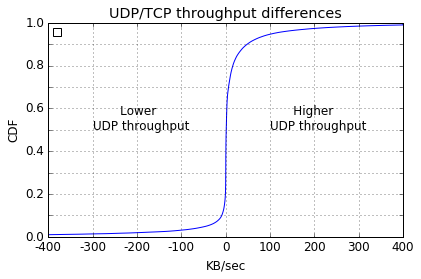

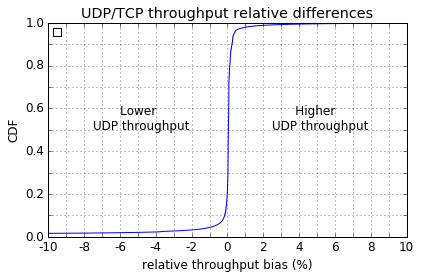

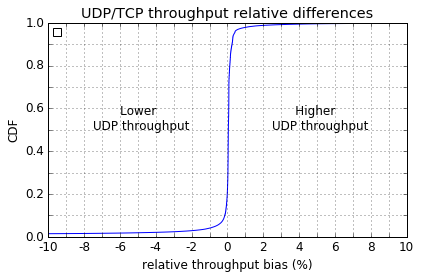

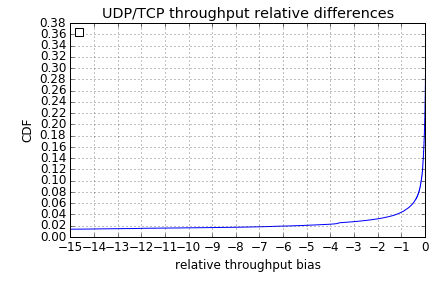

In [24]:
#PlanetLab throughput biases (absolute & relative)
save = False
fmt = 'pdf'
imp.reload(graph)

clip_at = 400000
this_clipped_diff = diff["bw_adiff"].clip(-clip_at, clip_at)
_=cdf(this_clipped_diff, "UDP/TCP throughput differences", "KB/sec", "CDF", 
          output_dir+"/throughput-adiff-cdf.{}".format(fmt) if save else None, num=100000,
        ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),
               ("      Higher\nUDP throughput",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,clip_at/4),
          xtickslabel=["-400", "-300", "-200", "-100", "0", "100", "200", "300", "400",],
          yticks=np.arange(0,clip_at+1,clip_at/10)/clip_at,
          ytickslabel=[str(e/clip_at) if (e%(clip_at/5)==0) else "" for e in range(0,clip_at+1,int(clip_at/10))])

# raw rtts
clip_at = 10
this_clipped_diff = diff["bw_rdiff"].clip(-clip_at, clip_at)
test = this_clipped_diff
_=cdf(this_clipped_diff, "UDP/TCP throughput relative differences", "relative throughput bias (%)", "CDF", 
          output_dir+"/throughput-rdiff-cdf.{}".format(fmt) if save else None, num=10000,
                    ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),
               ("      Higher\nUDP throughput",(0.25*clip_at,.5))],font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,1),
          xtickslabel=[str(e) if (e%2==0) else "" for e in np.arange(-clip_at,clip_at+1,1)],
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)])

# raw rtts
node_filter = (diff.sourceIPv4Address != 153) & (diff.destinationIPv4Address != 153)
clip_at = 10
this_clipped_diff = diff[node_filter]["bw_rdiff"].clip(-clip_at, clip_at)
_=cdf(this_clipped_diff, "UDP/TCP throughput relative differences", "relative throughput bias (%)", "CDF", 
          output_dir+"/f-throughput-rdiff-cdf.{}".format(fmt) if save else None, num=10000,
          ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),
               ("      Higher\nUDP throughput",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,1),
          xtickslabel=[str(e) if (e%2==0) else "" for e in np.arange(-clip_at,clip_at+1,1)],
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)])

clip_at = 15
this_clipped_diff = diff["bw_rdiff"].clip(-clip_at, clip_at)
_=cdf(this_clipped_diff, "UDP/TCP throughput relative differences", "relative throughput bias", "CDF", 
          None, num=10000,
          ann=[("Smaller UDP throughput",(-2.5,.5)),("Higher UDP throughput",(0.5,.5))], font_size=12,
                   xticks=np.arange(-clip_at,0+1,1),xlim=(-10,0),
          yticks=np.arange(0,40,2)/100, ylim=(0,0.2))

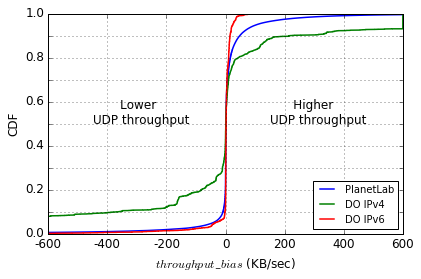

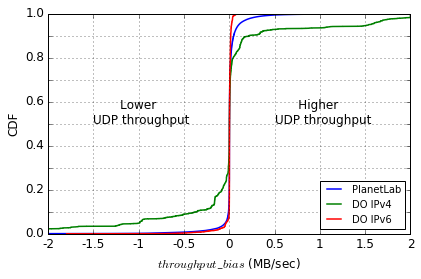

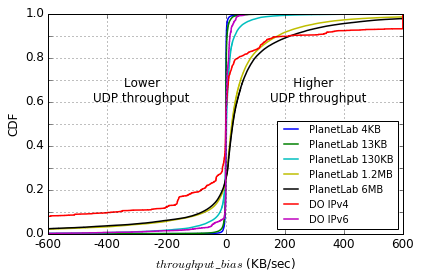

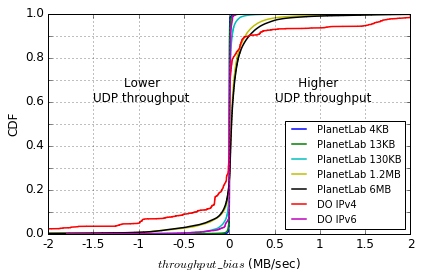

In [26]:
# abs throughput bias
import graph
save = False
fmt = 'pdf'

clip_at = 600000

clipped_pl    = diff["bw_adiff"].clip(-clip_at, clip_at)
clipped_do4    = t_do4["bw_adiff"].clip(-clip_at, clip_at)
clipped_do6    = t_do6["bw_adiff"].clip(-clip_at, clip_at)

data = [clipped_pl, clipped_do4,  clipped_do6]
_=graph.cdf(data, "", "$throughput\_bias$ (KB/sec)", "CDF", 
          output_dir+"/t-adiff-cdf.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "DO IPv4", "DO IPv6"], 
          linestyles=["solid","solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g', 'r', 'c'], legendloc=4,
          ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),("      Higher\nUDP throughput",(0.25*clip_at,.5))], 
          font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,200000),
          xtickslabel=["-600", "-400", "-200", "0", "200", "400", "600"],
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)

clip_at = 2000000

clipped_pl    = diff["bw_adiff"].clip(-clip_at, clip_at)
clipped_do4    = t_do4["bw_adiff"].clip(-clip_at, clip_at)
clipped_do6    = t_do6["bw_adiff"].clip(-clip_at, clip_at)

data = [clipped_pl, clipped_do4,  clipped_do6]
_=graph.cdf(data, "", "$throughput\_bias$ (MB/sec)", "CDF", 
          output_dir+"/t-adiff-cdf2.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "DO IPv4", "DO IPv6"], 
          linestyles=["solid","solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g', 'r', 'c'], legendloc=4,
          ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),("      Higher\nUDP throughput",(0.25*clip_at,.5))], 
          font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,500000),
          xtickslabel=["-2", "-1.5", "-1", "-0.5", "0", "0.5", "1", "1.5", "2"],
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.50)


clip_at = 600000
those_sizes=[4096, 12288, 122880, 1228800, 6144000]

pl_persize = []
labels = []
for s in those_sizes:
    labels.append("PlanetLab "+sizes[s])
    pl_persize.append(diff[diff.copycatFileSize == s]["bw_adiff"].clip(-clip_at, clip_at))
clipped_do4       = t_do4["bw_adiff"].clip(-clip_at, clip_at)
clipped_do6       = t_do6["bw_adiff"].clip(-clip_at, clip_at)

data=pl_persize+[clipped_do4, clipped_do6]
_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (KB/sec)", "CDF", 
          output_dir+"/t-adiff-cdf-persize.{}".format(fmt) if save else None, num=10000,
          labels=labels+["DO IPv4 ", "DO IPv6"], 
          linestyles=["solid", "solid", "solid", "solid", "solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g',  'c', 'y', 'k', 'r', 'm'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.6)),("      Higher\nUDP throughput",(0.25*clip_at,.6))], font_size=12,
           xticks=np.arange(-clip_at,clip_at+1,200000),
          xtickslabel=["-600", "-400", "-200", "0", "200", "400", "600"],
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)

############################################

clip_at = 2000000
pl_persize = []
labels = []
for s in those_sizes:
    labels.append("PlanetLab "+sizes[s])
    pl_persize.append(diff[diff.copycatFileSize == s]["bw_adiff"].clip(-clip_at, clip_at))
clipped_do4       = t_do4["bw_adiff"].clip(-clip_at, clip_at)
clipped_do6       = t_do6["bw_adiff"].clip(-clip_at, clip_at)

data=pl_persize+[clipped_do4, clipped_do6]
_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (MB/sec)", "CDF", 
          output_dir+"/t-adiff-cdf-persize2.{}".format(fmt) if save else None, num=10000,
          labels=labels+["DO IPv4 ", "DO IPv6"], 
          linestyles=["solid", "solid", "solid", "solid", "solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g',  'c', 'y', 'k', 'r', 'm'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.6)),("      Higher\nUDP throughput",(0.25*clip_at,.6))], 
            font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,500000),
           xtickslabel=["-2", "-1.5", "-1", "-0.5", "0", "0.5", "1", "1.5", "2"],
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)



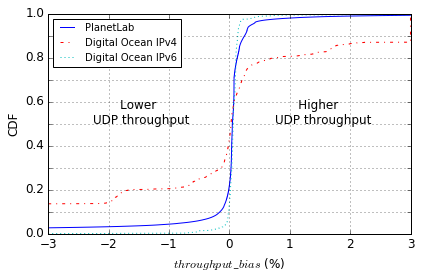

740421 95.50%
34896 4.50%
< -200KB/sec: 14920 (42.76%) > 200KB/sec 19976 (57.24%)

10846 77.55%
3140 22.45%
< -200KB/sec: 1692 (53.89%) > 200KB/sec 1448 (46.11%)

12244 98.57%
178 1.43%
< -200KB/sec: 175 (98.31%) > 200KB/sec 3 (1.69%)



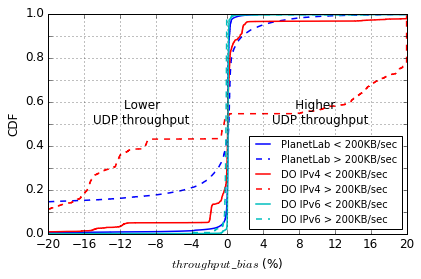

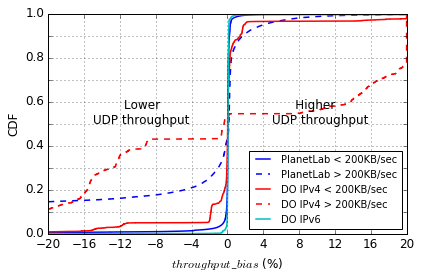

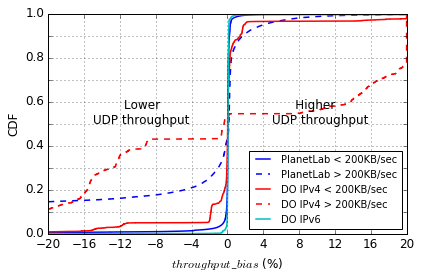

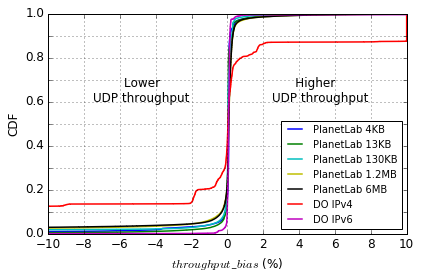

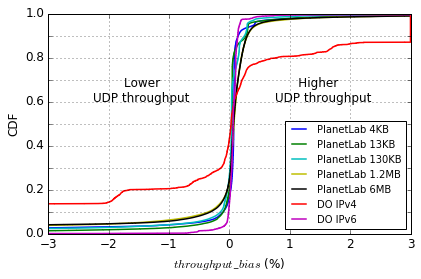

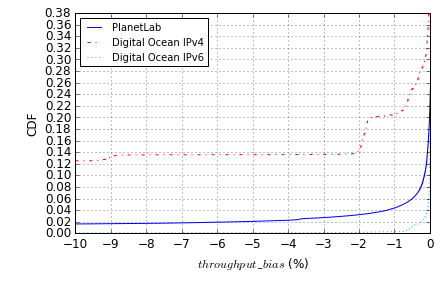

In [28]:
# raw throughput
import graph
save = False
fmt = 'pdf'

# clip outliers
clip_at = 3.0
clipped_pl    = diff["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4    = t_do4["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6    = t_do6["bw_rdiff"].clip(-clip_at, clip_at)
# UDP/TCP initial RTTs relative differences
_=graph.cdf([clipped_pl, clipped_do4, clipped_do6], "", "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "Digital Ocean IPv4", "Digital Ocean IPv6"], 
          linestyles=["solid","dashdot", "dotted"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'r', 'c'],
          ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),("      Higher\nUDP throughput",(0.25*clip_at,.5))], 
          font_size=12,
          xticks=np.arange(-clip_at,clip_at+1,1),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)])

clip_at = 20
split_at = 200000
clipped_pl_low    = diff[(diff.bw_adiff > -split_at) & (diff.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[(diff.bw_adiff <= -split_at) | (diff.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4_low    = t_do4[(t_do4.bw_adiff > -split_at) & (t_do4.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4_high    = t_do4[(t_do4.bw_adiff <= -split_at) | (t_do4.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6_low    = t_do6[(t_do6.bw_adiff > -split_at) & (t_do6.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6_high    = t_do6[(t_do6.bw_adiff <= -split_at) | (t_do6.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)

data=[clipped_pl_low, clipped_pl_high, clipped_do4_low, clipped_do4_high, clipped_do6_low, clipped_do6_high]
for i,d in enumerate(data):
    items=len(d)   
    if i<=1:
        rate=items/len(diff)
    elif i<=3:
        rate=items/len(rtt_do4)
    elif i<=5:
        rate=items/len(rtt_do6)
        
    print("{0} {1:.2f}%".format(items, rate*100.0 ))
    if i ==1:
        print("< -200KB/sec: {0} ({2:.2f}%) > 200KB/sec {1} ({3:.2f}%)\n".format(
                       len(diff[diff.bw_adiff <= -split_at]),  
                       len(diff[diff.bw_adiff >= split_at]),
                       (len(diff[diff.bw_adiff <= -split_at])/float(items))*100.0,  
                       (len(diff[diff.bw_adiff >= split_at])/float(items))*100.0))
    elif i ==3:
        print("< -200KB/sec: {0} ({2:.2f}%) > 200KB/sec {1} ({3:.2f}%)\n".format(
                       len(t_do4[t_do4.bw_adiff <= -split_at]),  
                       len(t_do4[t_do4.bw_adiff >= split_at]),
                       (len(t_do4[t_do4.bw_adiff <= -split_at])/float(items))*100.0,  
                       (len(t_do4[t_do4.bw_adiff >= split_at])/float(items))*100.0))                                  
    elif i ==5:
        print("< -200KB/sec: {0} ({2:.2f}%) > 200KB/sec {1} ({3:.2f}%)\n".format(
                       len(t_do6[t_do6.bw_adiff <= -split_at]),  
                       len(t_do6[t_do6.bw_adiff >= split_at]),
                       (len(t_do6[t_do6.bw_adiff <= -split_at])/float(items))*100.0,  
                       (len(t_do6[t_do6.bw_adiff >= split_at])/float(items))*100.0))                                     

_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf-zoomed.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab < 200KB/sec", "PlanetLab > 200KB/sec",  "DO IPv4 < 200KB/sec", "DO IPv4 > 200KB/sec", 
                  "DO IPv6 < 200KB/sec", "DO IPv6 > 200KB/sec"], 
          linestyles=["solid", "dashed", "solid", "dashed", "solid", "dashed"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'b', 'r', 'r', 'c', 'c'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.5)),("      Higher\nUDP throughput",(0.25*clip_at,.5))], font_size=12,
          #xticks=np.arange(-clip_at,clip_at+1,1),
          xticks=np.arange(-clip_at,clip_at+1,4),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)

clip_at = 20
split_at = 200000
clipped_pl_low    = diff[(diff.bw_adiff > -split_at) & (diff.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[(diff.bw_adiff <= -split_at) | (diff.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4_low    = t_do4[(t_do4.bw_adiff > -split_at) & (t_do4.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4_high    = t_do4[(t_do4.bw_adiff <= -split_at) | (t_do4.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6       = t_do6["bw_rdiff"].clip(-clip_at, clip_at)

data=[clipped_pl_low, clipped_pl_high, clipped_do4_low, clipped_do4_high, clipped_do6]
_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf-zoomed-filtered.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab < 200KB/sec", "PlanetLab > 200KB/sec",  
                  "DO IPv4 < 200KB/sec", "DO IPv4 > 200KB/sec", 
                  "DO IPv6"], 
          linestyles=["solid", "dashed", "solid", "dashed", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'b', 'r', 'r', 'c'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.5)),("      Higher\nUDP throughput",(0.25*clip_at,.5))], font_size=12,
          #xticks=np.arange(-clip_at,clip_at+1,1),
          xticks=np.arange(-clip_at,clip_at+1,4),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)
###################################

clip_at = 20
split_at = 200000
clipped_pl_low    = diff[diff.copycatFileSize >= 1228800][(diff.bw_adiff > -split_at) & (diff.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[diff.copycatFileSize >= 1228800][(diff.bw_adiff <= -split_at) | (diff.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4_low    = t_do4[(t_do4.bw_adiff > -split_at) & (t_do4.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4_high    = t_do4[(t_do4.bw_adiff <= -split_at) | (t_do4.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6       = t_do6["bw_rdiff"].clip(-clip_at, clip_at)

data=[clipped_pl_low, clipped_pl_high, clipped_do4_low, clipped_do4_high, clipped_do6]
_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf-zoomed-filtered2.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab < 200KB/sec", "PlanetLab > 200KB/sec",  
                  "DO IPv4 < 200KB/sec", "DO IPv4 > 200KB/sec", 
                  "DO IPv6"], 
          linestyles=["solid", "dashed", "solid", "dashed", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'b', 'r', 'r', 'c'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.5)),("      Higher\nUDP throughput",(0.25*clip_at,.5))], font_size=12,
          #xticks=np.arange(-clip_at,clip_at+1,1),
          xticks=np.arange(-clip_at,clip_at+1,4),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)
###################################
clip_at = 10
clipped_pl_low    = diff[(diff.bw_adiff > -split_at) & (diff.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[(diff.bw_adiff <= -split_at) | (diff.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)

those_sizes=[4096, 12288, 122880, 1228800, 6144000]

pl_persize = []
labels = []
for s in those_sizes:
    labels.append("PlanetLab "+sizes[s])
    pl_persize.append(diff[diff.copycatFileSize == s]["bw_rdiff"].clip(-clip_at, clip_at))
clipped_do4       = t_do4["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6       = t_do6["bw_rdiff"].clip(-clip_at, clip_at)

data=pl_persize+[clipped_do4, clipped_do6]
_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf-persize.{}".format(fmt) if save else None, num=10000,
          labels=labels+["DO IPv4 ", "DO IPv6"], 
          linestyles=["solid", "solid", "solid", "solid", "solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g',  'c', 'y', 'k', 'r', 'm'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.6)),("      Higher\nUDP throughput",(0.25*clip_at,.6))], font_size=12,
          #xticks=np.arange(-clip_at,clip_at+1,1),
          xticks=np.arange(-clip_at,clip_at+1,2),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)

############################################

clip_at = 3
clipped_pl_low    = diff[(diff.bw_adiff > -split_at) & (diff.bw_adiff < split_at)]["bw_rdiff"].clip(-clip_at, clip_at)
clipped_pl_high    = diff[(diff.bw_adiff <= -split_at) | (diff.bw_adiff >= split_at)]["bw_rdiff"].clip(-clip_at, clip_at)


pl_persize = []
labels = []
for s in those_sizes:
    labels.append("PlanetLab "+sizes[s])
    pl_persize.append(diff[diff.copycatFileSize == s]["bw_rdiff"].clip(-clip_at, clip_at))
clipped_do4       = t_do4["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6       = t_do6["bw_rdiff"].clip(-clip_at, clip_at)

data=pl_persize+[clipped_do4, clipped_do6]
_=graph.cdf(data, 
            "", 
            "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf-persize2.{}".format(fmt) if save else None, num=10000,
          labels=labels+["DO IPv4 ", "DO IPv6"], 
          linestyles=["solid", "solid", "solid", "solid", "solid", "solid", "solid"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'g',  'c', 'y', 'k', 'r', 'm'], legendloc=4,
          ann=[("        Lower\nUDP throughput",(-0.75*clip_at,.6)),("      Higher\nUDP throughput",(0.25*clip_at,.6))], font_size=12,
          #xticks=np.arange(-clip_at,clip_at+1,1),
          xticks=np.arange(-clip_at,clip_at+1,1),
          yticks=np.arange(0,11,1)/10, 
          ytickslabel=[str(e/10) if (e%2==0) else "" for e in range(0,11,1)], linewidth=1.5)


# clip outliers
clip_at = 10
clipped_pl    = diff["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do4    = t_do4["bw_rdiff"].clip(-clip_at, clip_at)
clipped_do6    = t_do6["bw_rdiff"].clip(-clip_at, clip_at)
# UDP/TCP initial RTTs relative differences
_=graph.cdf([clipped_pl, clipped_do4, clipped_do6], "", "$throughput\_bias$ (%)", "CDF", 
          output_dir+"/t-rdiff-cdf2.{}".format(fmt) if save else None, num=10000,
          labels=["PlanetLab", "Digital Ocean IPv4", "Digital Ocean IPv6"], 
          linestyles=["solid","dashdot", "dotted"],
          #cmap='Greys', cmap_index=[0.2,0.6,0.99],
          colors=['b', 'r', 'c'],
          ann=[("       Lower\nUDP throughput",(-0.75*clip_at,.5)),
               ("      Higher\nUDP throughput",(0.25*clip_at,.5))], font_size=12,
          xticks=np.arange(-clip_at,0+1,1),xlim=(-10,0),
          yticks=np.arange(0,40,2)/100, ylim=(0,0.2))



In [37]:
#rtt
clip_at = 20
split_at = 50
pl_low_median    = diff[(diff.rtt_adiff > -split_at) & (diff.rtt_adiff < split_at)]["rtt_rdiff"].median()
pl_high_median    = diff[(diff.rtt_adiff <= -split_at) | (diff.rtt_adiff >= split_at)]["rtt_rdiff"].median()
atlas_low_median    = rtt_atlas[(rtt_atlas.rtt_adiff > -split_at) & (rtt_atlas.rtt_adiff < split_at)]["rtt_rdiff"].median()
atlas_high_median    = rtt_atlas[(rtt_atlas.rtt_adiff <= -split_at) | (rtt_atlas.rtt_adiff >= split_at)]["rtt_rdiff"].median()
do4_low_median    = rtt_do4[(rtt_do4.rtt_adiff > -split_at) & (rtt_do4.rtt_adiff < split_at)]["rtt_rdiff"].median()
do4_high_median    = rtt_do4[(rtt_do4.rtt_adiff <= -split_at) | (rtt_do4.rtt_adiff >= split_at)]["rtt_rdiff"].median()
do6_low_median    = rtt_do6[(rtt_do6.rtt_adiff > -split_at) & (rtt_do6.rtt_adiff < split_at)]["rtt_rdiff"].median()
do6_high_median    = rtt_do6[(rtt_do6.rtt_adiff <= -split_at) | (rtt_do6.rtt_adiff >= split_at)]["rtt_rdiff"].median()

print("RTT")
print("    <50ms  >50ms")
print("PL : {0:.2f}% {1:.2f}%".format(pl_low_median, pl_high_median))
print("AT : {0:.2f}% {1:.2f}%".format(atlas_low_median, atlas_high_median))
print("DO4: {0:.2f}% {1:.2f}%".format(do4_low_median, do4_high_median))
print("DO6: {0:.2f}% {1:.2f}%".format(do6_low_median, do6_high_median))

#throughput
clip_at = 20
split_at = 200000
pl_low_median    = diff[(diff.bw_adiff > -split_at) & (diff.bw_adiff < split_at)]["bw_rdiff"].median()
pl_high_median    = diff[(diff.bw_adiff <= -split_at) | (diff.bw_adiff >= split_at)]["bw_rdiff"].median()
do4_low_median    = t_do4[(t_do4.bw_adiff > -split_at) & (t_do4.bw_adiff < split_at)]["bw_rdiff"].median()
do4_high_median    = t_do4[(t_do4.bw_adiff <= -split_at) | (t_do4.bw_adiff >= split_at)]["bw_rdiff"].median()
do6_low_median    = t_do6[(t_do6.bw_adiff > -split_at) & (t_do6.bw_adiff < split_at)]["bw_rdiff"].median()
do6_high_median    = t_do6[(t_do6.bw_adiff <= -split_at) | (t_do6.bw_adiff >= split_at)]["bw_rdiff"].median()

print("\nThroughput")
print("  <200kb/s  >200kb/s")
print("PL : {0:.2f}% {1:.2f}%".format(pl_low_median, pl_high_median))
print("DO4: {0:.2f}% {1:.2f}%".format(do4_low_median, do4_high_median))
print("DO6: {0:.2f}% {1:.2f}%".format(do6_low_median, do6_high_median))

RTT
    <50ms  >50ms
PL : 0.00% -1.65%
AT : 0.00% -4.75%
DO4: -0.02% -0.44%
DO6: 0.00% 3.63%

Throughput
  <200kb/s  >200kb/s
PL : 0.05% 0.16%
DO4: 0.03% -0.37%
DO6: 0.07% -0.16%


In [47]:

split_at=25
pl_size=len(diff)
pl_l25= len(diff[(diff.rtt_adiff > -split_at) & (diff.rtt_adiff < split_at)])
pl_m25=len(diff[(diff.rtt_adiff <= -split_at) | (diff.rtt_adiff >= split_at)])

at_size=len(rtt_atlas)
at_l25= len(rtt_atlas[(rtt_atlas.rtt_adiff > -split_at) & (rtt_atlas.rtt_adiff < split_at)])
at_m25=len(rtt_atlas[(rtt_atlas.rtt_adiff <= -split_at) | (rtt_atlas.rtt_adiff >= split_at)])

do4_size=len(rtt_do4)
do4_l25= len(rtt_do4[(rtt_do4.rtt_adiff > -split_at) & (rtt_do4.rtt_adiff < split_at)])
do4_m25=len(rtt_do4[(rtt_do4.rtt_adiff <= -split_at) | (rtt_do4.rtt_adiff >= split_at)])

do6_size=len(rtt_do6)
do6_l25= len(rtt_do6[(rtt_do6.rtt_adiff > -split_at) & (rtt_do6.rtt_adiff < split_at)])
do6_m25=len(rtt_do6[(rtt_do6.rtt_adiff <= -split_at) | (rtt_do6.rtt_adiff >= split_at)])

print("    <25ms  >25ms")
print("PL: {0:.2f}% {1:.2f}%".format((pl_l25/pl_size)*100, (pl_m25/pl_size)*100))
print("AT : {0:.2f}% {1:.2f}%".format((at_l25/at_size)*100, (at_m25/at_size)*100))
print("DO4: {0:.2f}% {1:.2f}%".format((do4_l25/do4_size)*100, (do4_m25/do4_size)*100))
print("DO6: {0:.2f}% {1:.2f}%".format((do6_l25/do6_size)*100, (do6_m25/do6_size)*100))

split_at=10
pl_size=len(diff)
pl_l25= len(diff[(diff.rtt_adiff > -split_at) & (diff.rtt_adiff < split_at)])
pl_m25=len(diff[(diff.rtt_adiff <= -split_at) | (diff.rtt_adiff >= split_at)])

at_size=len(rtt_atlas)
at_l25= len(rtt_atlas[(rtt_atlas.rtt_adiff > -split_at) & (rtt_atlas.rtt_adiff < split_at)])
at_m25=len(rtt_atlas[(rtt_atlas.rtt_adiff <= -split_at) | (rtt_atlas.rtt_adiff >= split_at)])

do4_size=len(rtt_do4)
do4_l25= len(rtt_do4[(rtt_do4.rtt_adiff > -split_at) & (rtt_do4.rtt_adiff < split_at)])
do4_m25=len(rtt_do4[(rtt_do4.rtt_adiff <= -split_at) | (rtt_do4.rtt_adiff >= split_at)])

do6_size=len(rtt_do6)
do6_l25= len(rtt_do6[(rtt_do6.rtt_adiff > -split_at) & (rtt_do6.rtt_adiff < split_at)])
do6_m25=len(rtt_do6[(rtt_do6.rtt_adiff <= -split_at) | (rtt_do6.rtt_adiff >= split_at)])

print("\n    <10ms  >10ms")
print("PL: {0:.2f}% {1:.2f}%".format((pl_l25/pl_size)*100, (pl_m25/pl_size)*100))
print("AT : {0:.2f}% {1:.2f}%".format((at_l25/at_size)*100, (at_m25/at_size)*100))
print("DO4: {0:.2f}% {1:.2f}%".format((do4_l25/do4_size)*100, (do4_m25/do4_size)*100))
print("DO6: {0:.2f}% {1:.2f}%".format((do6_l25/do6_size)*100, (do6_m25/do6_size)*100))

    <25ms  >25ms
PL: 94.81% 5.19%
AT : 97.61% 2.39%
DO4: 50.78% 49.22%
DO6: 99.81% 0.19%

    <10ms  >10ms
PL: 85.70% 14.30%
AT : 93.89% 6.11%
DO4: 31.27% 68.73%
DO6: 86.85% 13.15%


In [54]:
print("Digital Ocean IPv4:\n<1%: {0}ms\n>99%: {1}ms".format(rtt_do4.rtt_adiff.quantile(0.01), 
                                                            rtt_do4.rtt_adiff.quantile(0.99)))


Digital Ocean IPv4:
<1%: -255.0ms
>99%: 258.0ms


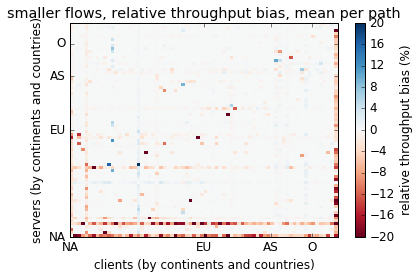

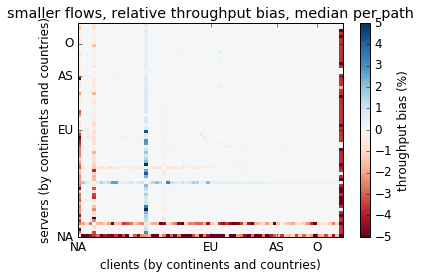

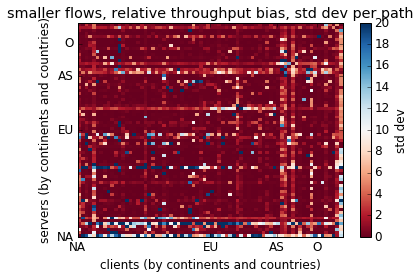

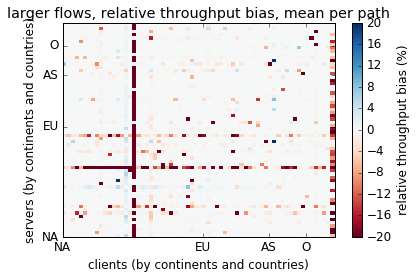

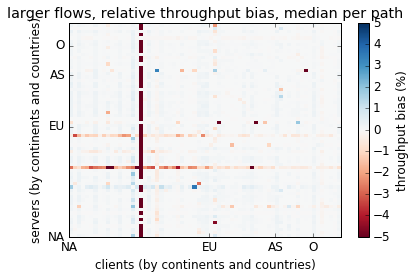

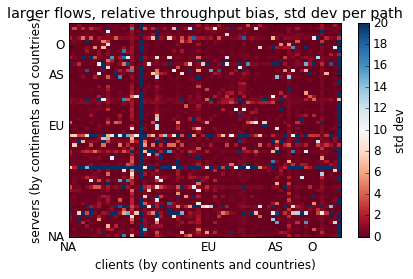

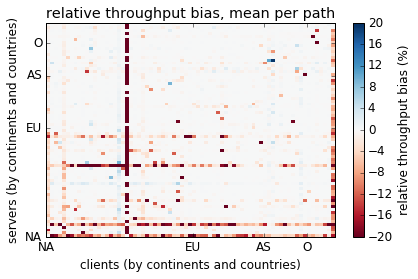

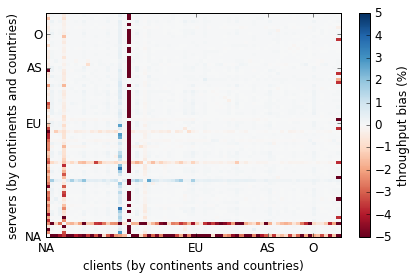

In [173]:
save = False
fmt = "jpg"
cmap = "RdBu"
import graph
imp.reload(graph)
small_flows = diff[(diff.copycatFileSize == 4096) | (diff.copycatFileSize == 12288)]
diff_grid(small_flows, "bw_rdiff", np.mean, "mean", "smaller flows, relative throughput bias, mean per path".format(size), 
          vrange=[-20,20], zlegend="relative throughput bias (%)", cmap=cmap,
          file=output_dir+"small-t-rdiff-mean."+fmt if save else None)

graph.diff_grid(small_flows, "bw_rdiff", np.median, "median", "smaller flows, relative throughput bias, median per path".format(size), 
          vrange=[-5,5], zlegend="throughput bias (%)", cmap=cmap,
          file=output_dir+"small-t-rdiff-median."+fmt if save else None)
diff_grid(small_flows, "bw_rdiff", np.std, "std", "smaller flows, relative throughput bias, std dev per path".format(size), 
          vrange=[0,20], zlegend="std dev", cmap=cmap,
          file=output_dir+"small-t-rdiff-stddev."+fmt if save else None)
del small_flows


large_flows = diff[(diff.copycatFileSize == 122880) | (diff.copycatFileSize == 1228800) | 
                       (diff.copycatFileSize == 6144000)]
diff_grid(large_flows, "bw_rdiff", np.mean, "mean", "larger flows, relative throughput bias, mean per path".format(size), 
          vrange=[-20,20], zlegend="relative throughput bias (%)", cmap=cmap,
          file=output_dir+"large-t-rdiff-mean."+fmt if save else None)
graph.diff_grid(large_flows, "bw_rdiff", np.median, "median", "larger flows, relative throughput bias, median per path".format(size), 
          vrange=[-5,5], zlegend="throughput bias (%)", cmap=cmap,
          file=output_dir+"large-t-rdiff-median."+fmt if save else None)
diff_grid(large_flows, "bw_rdiff", np.std, "std", "larger flows, relative throughput bias, std dev per path".format(size), 
          vrange=[0,20], zlegend="std dev", cmap=cmap,
          file=output_dir+"large-t-rdiff-stddev."+fmt if save else None)
del large_flows

diff_grid(diff, "bw_rdiff", np.mean, "mean", "relative throughput bias, mean per path".format(size), 
          vrange=[-20,20], zlegend="relative throughput bias (%)", cmap=cmap,
          file=output_dir+"all-t-rdiff-mean."+fmt if save else None)
test = graph.diff_grid(diff, "bw_rdiff", np.median, "median", "", 
          vrange=[-5,5], zlegend="throughput bias (%)", cmap=cmap,
          file=output_dir+"all-t-rdiff-median."+fmt if save else None)

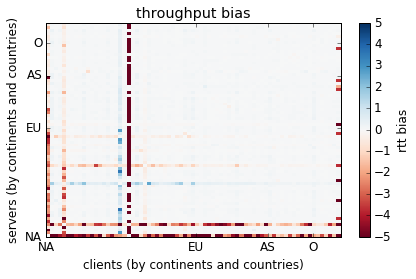

In [168]:
index = ["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort", 
         "copycatRunId", "copycatFileSize", "copycatCampaignId"]
grid_index =["destinationIPv4Address", "sourceIPv4Address"]
col = "bw_rdiff"
new_col = "median"
func = np.median
cmap = "RdBu"

diff_df = diff.copy()
diff_df, diff_dim = clean_df(diff_df)
diff_index = get_continent_index(diff_df)
grouped_diff  = diff_df.groupby(grid_index)[col]
diff_df       = grouped_diff.agg([func]).reset_index()
diff_df       = diff_df.set_index(grid_index)[new_col].unstack().fillna(0)

gridplot(diff_df, "rtt bias", vrange=[-5,5], lim=[0,diff_dim], 
     title="throughput bias",  font_size=12, cmap=cmap, file="",
     ticks=diff_index)


port 8008
TCP throughput, mean runs, mean nodes = 226024.9913
UDP throughput, mean runs, mean nodes = 186860.795175
total diff mean throughput = -37044.34


port 12345
TCP throughput, mean runs, mean nodes = 242823.206835
UDP throughput, mean runs, mean nodes = 186248.591784
total diff mean throughput = -46777.83


port 33435
TCP throughput, mean runs, mean nodes = 234731.605719
UDP throughput, mean runs, mean nodes = 194897.602855
total diff mean throughput = -41006.90


port 34567
TCP throughput, mean runs, mean nodes = 221589.642934
UDP throughput, mean runs, mean nodes = 183385.16181
total diff mean throughput = -38548.18


port 54321
TCP throughput, mean runs, mean nodes = 221482.817178
UDP throughput, mean runs, mean nodes = 183059.690478
total diff mean throughput = -39566.06



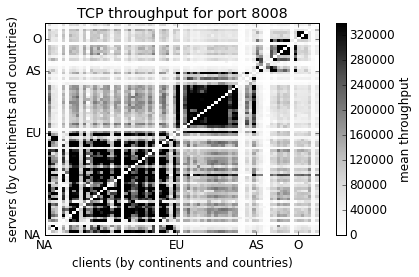

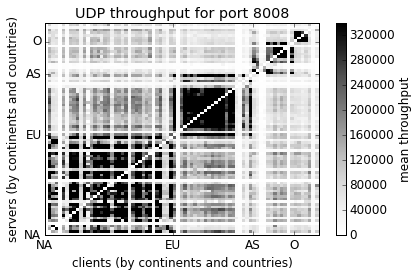

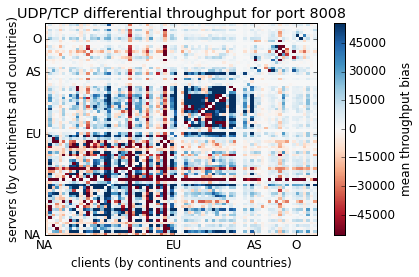

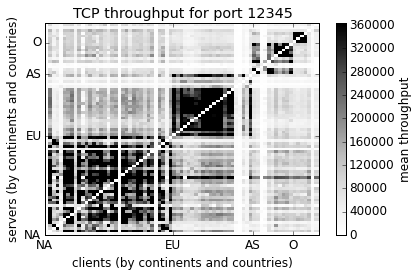

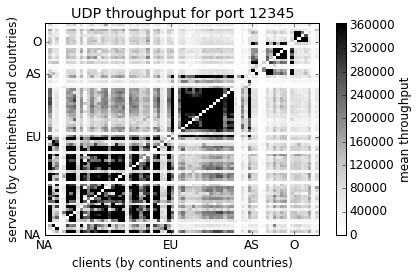

...

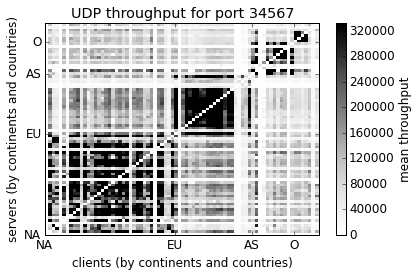

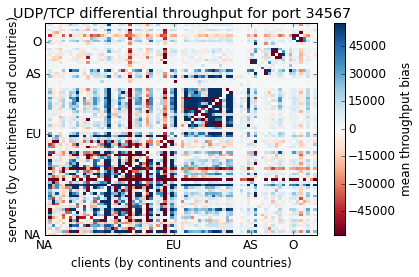

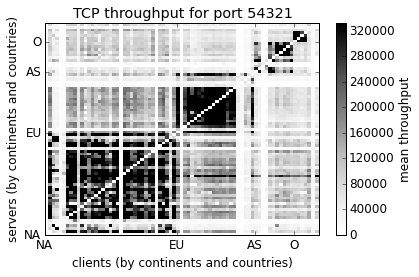

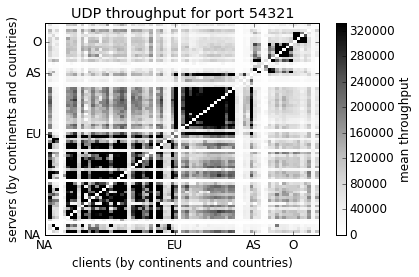

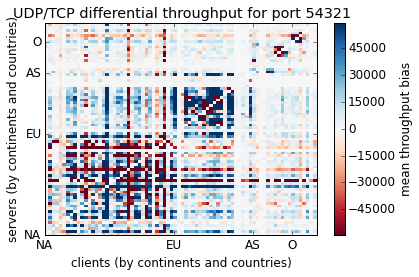

In [120]:
graph.agg(tcp, udp, np.mean, "mean", "throughput", 
    large_is_better=True, legend1="throughput", legend2="throughput bias", 
    ports=ports2, cmap1="Greys", cmap2="RdBu")


port 8008
TCP throughput, median runs, mean nodes = 171004.03872
UDP throughput, median runs, mean nodes = 133621.946994
total diff median throughput = -34207.04


port 12345
TCP throughput, median runs, mean nodes = 181129.64072
UDP throughput, median runs, mean nodes = 131601.678409
total diff median throughput = -41789.18


port 33435
TCP throughput, median runs, mean nodes = 176829.371769
UDP throughput, median runs, mean nodes = 140437.307209
total diff median throughput = -35932.06


port 34567
TCP throughput, median runs, mean nodes = 168258.617282
UDP throughput, median runs, mean nodes = 134227.300938
total diff median throughput = -33086.86


port 54321
TCP throughput, median runs, mean nodes = 169102.162303
UDP throughput, median runs, mean nodes = 133433.528895
total diff median throughput = -35194.68



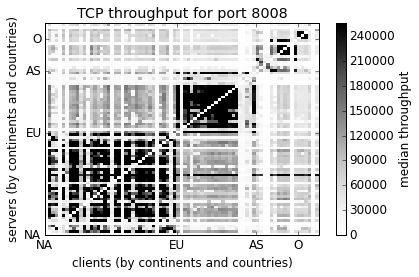

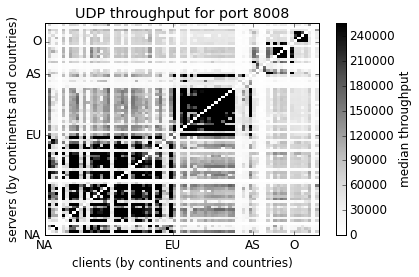

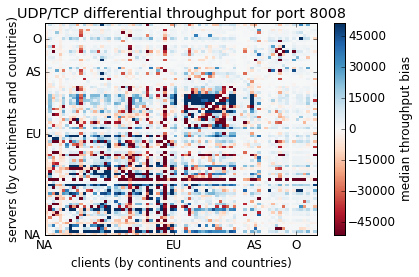

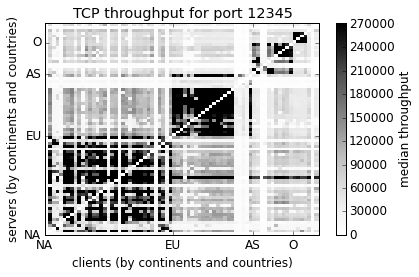

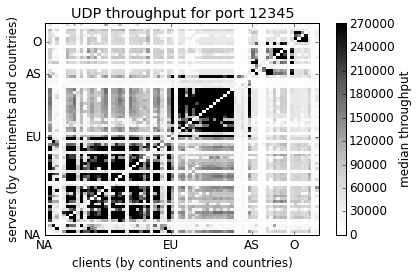

...

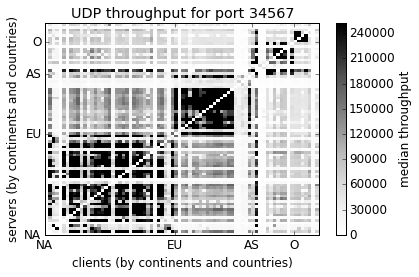

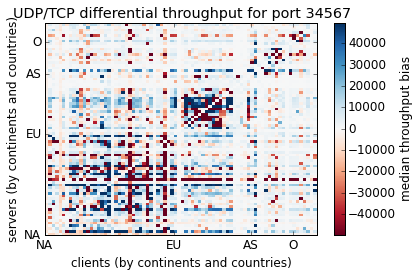

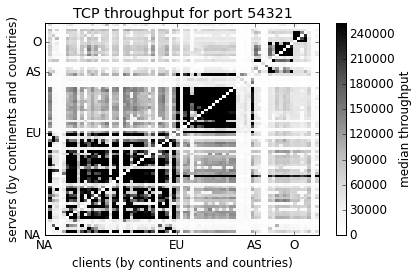

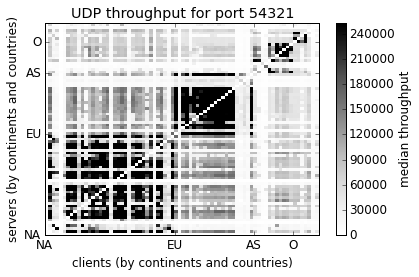

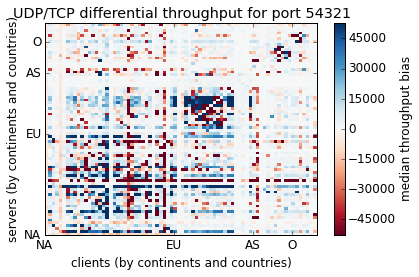

In [121]:
graph.agg(tcp, udp, np.median, "median", "throughput", 
    large_is_better=True, legend1="throughput", legend2="throughput bias", 
    ports=ports2, cmap1="Greys", cmap2="RdBu")


port 8008
TCP throughput, amax runs, mean nodes = 669671.349526
UDP throughput, amax runs, mean nodes = 564967.478009
total diff amax throughput = -108707.22


port 12345
TCP throughput, amax runs, mean nodes = 721310.050137
UDP throughput, amax runs, mean nodes = 552993.040738
total diff amax throughput = -146325.75


port 33435
TCP throughput, amax runs, mean nodes = 634332.137499
UDP throughput, amax runs, mean nodes = 553172.480647
total diff amax throughput = -92534.53


port 34567
TCP throughput, amax runs, mean nodes = 627260.758819
UDP throughput, amax runs, mean nodes = 529134.478162
total diff amax throughput = -108085.48


port 54321
TCP throughput, amax runs, mean nodes = 650434.461643
UDP throughput, amax runs, mean nodes = 536973.442306
total diff amax throughput = -126986.01



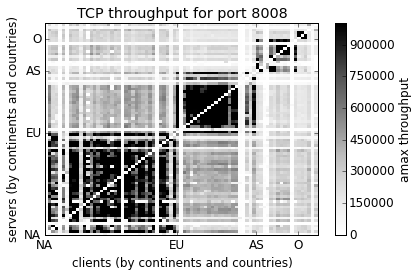

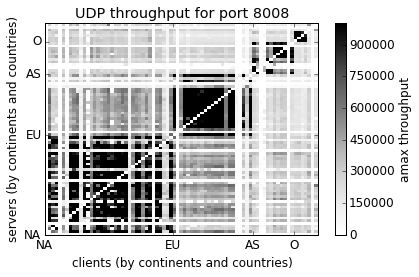

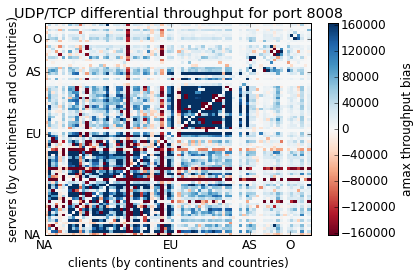

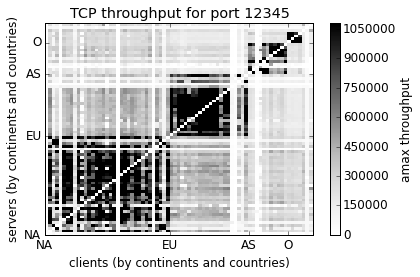

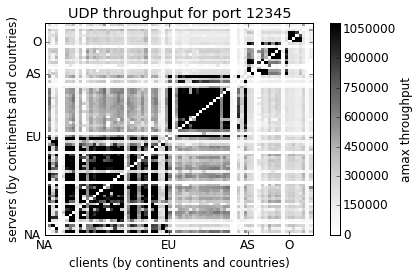

...

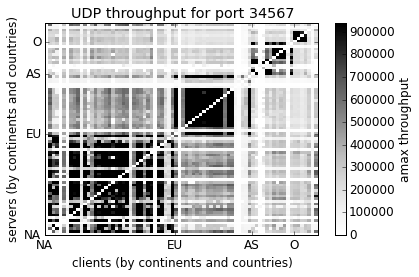

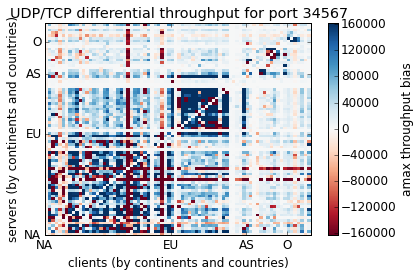

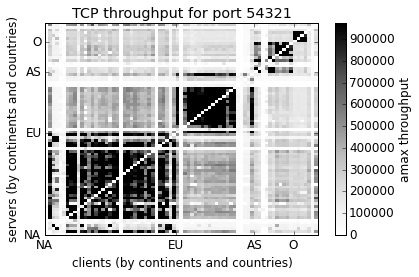

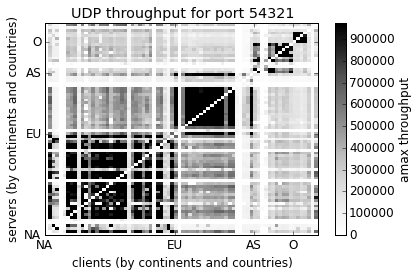

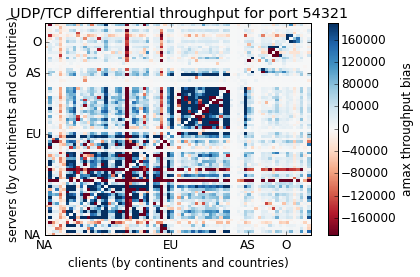

In [122]:
graph.agg(tcp, udp, np.max, "amax", "throughput",
    large_is_better=True, legend1="throughput", legend2="throughput bias", 
    ports=ports2, cmap1="Greys", cmap2="RdBu")

# Loss

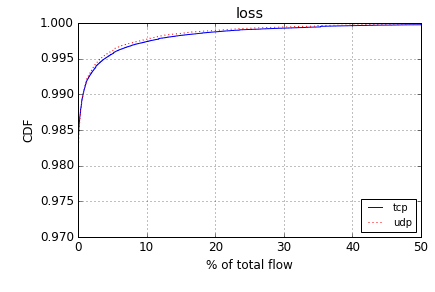

In [193]:
clip_at=50

this_filter = (diff.sourceIPv4Address != 153) & (diff.sourceIPv4Address != 44)
this_diff = diff[this_filter]

_=cdf([this_diff.tcp_loss.clip(0, clip_at), this_diff.udp_loss.clip(0, clip_at)], "loss",
    "% of total flow", "CDF", None, num=100000, labels=["tcp",  "udp"], 
    linestyles=["solid", "dotted"],
    #cmap='Greys', cmap_index=[0.2,0.6,0.99],
    colors=['b', 'r'],    
    legendloc=4,
    ann=[("Smaller UDP RTT",(-2.5,.5)),("Higher UDP RTT",(0.5,.5))], font_size=12,
    xticks=np.arange(0,clip_at+1,10), 
    xlim=(0,clip_at), ylim=(0.97,1.0)) 
        #ytickslabel=[str(e/100) if (e%2==0) else "" for e in range(90,101,2)])

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/ko/Desktop/2016/MAMI/copycat/analysis/graph.py:324: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  p.step(x, y, label=labels[i], color= colors[color_index], **kwargs)


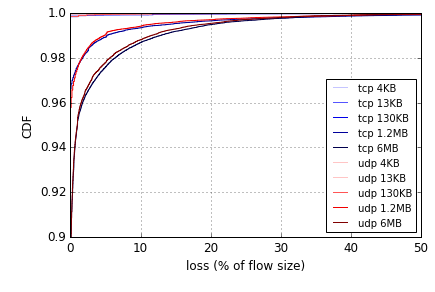

In [55]:
import graph, imp
clip_at = 100
save = False

this_filter = (diff.sourceIPv4Address != 153) & (diff.sourceIPv4Address != 44)
this_diff = diff[this_filter]
this_diff["tcp_loss"] = this_diff["tcp_loss"].clip(0, clip_at)
this_diff["udp_loss"] = this_diff["udp_loss"].clip(0, clip_at)
loss_per_flowsize = [this_diff[this_diff.copycatFileSize == 4096].tcp_loss,
                     this_diff[this_diff.copycatFileSize == 12288].tcp_loss,
                     this_diff[this_diff.copycatFileSize == 122880].tcp_loss,            
                     this_diff[this_diff.copycatFileSize == 1228800].tcp_loss,
                     this_diff[this_diff.copycatFileSize == 6144000].tcp_loss,
                     this_diff[this_diff.copycatFileSize == 4096].udp_loss,
                     this_diff[this_diff.copycatFileSize == 12288].udp_loss,
                     this_diff[this_diff.copycatFileSize == 122880].udp_loss,
                     this_diff[this_diff.copycatFileSize == 1228800].udp_loss,             
                     this_diff[this_diff.copycatFileSize == 6144000].udp_loss]

labels = ["tcp 4KB",  "tcp 13KB", "tcp 130KB", "tcp 1.2MB",  "tcp 6MB", 
          "udp 4KB", "udp 13KB", "udp 130KB", "udp 1.2MB",  "udp 6MB"]

_=cdf2(loss_per_flowsize, "",
        "loss (% of flow size)", "CDF", 
        output_dir+"sanitized-loss.pdf" if save else None, num=10000, labels=labels, 
        ann=[("Smaller UDP RTT",(-2.5,.5)),("Higher UDP RTT",(0.5,.5))], font_size=12,
        xticks=np.arange(0,50+1,10), xlim=(0,50),
        yticks=np.arange(90,101,2)/100.0, ylim=(0.9,1.0), legendoutside=True,
        ytickslabel=[str(e/100) if (e%2==0) else "" for e in range(90,101,2)])
del this_diff

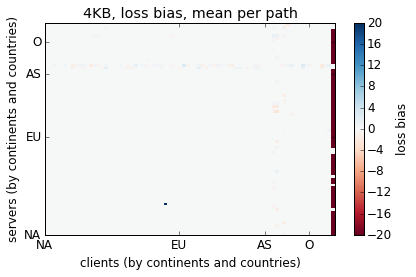

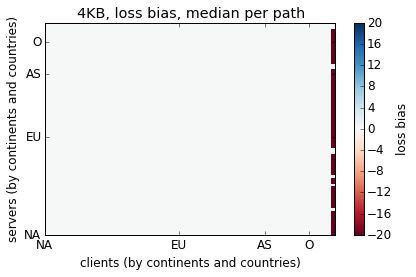

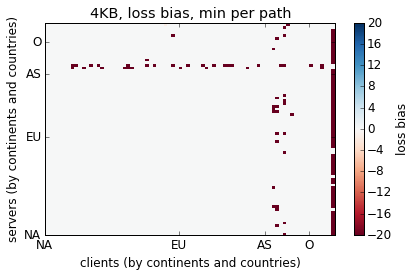

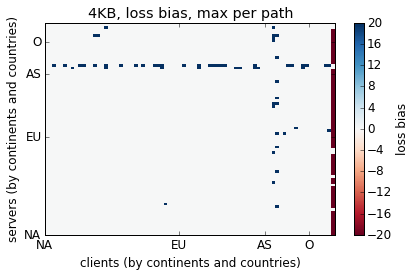

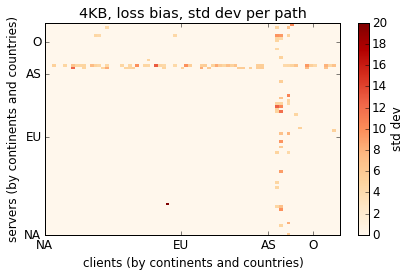

...

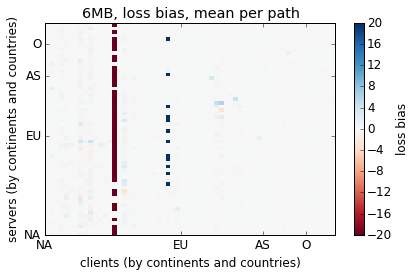

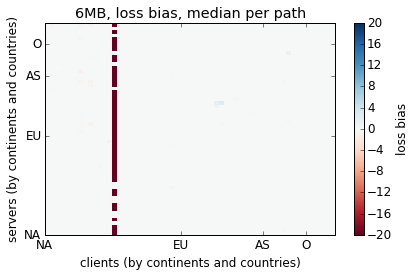

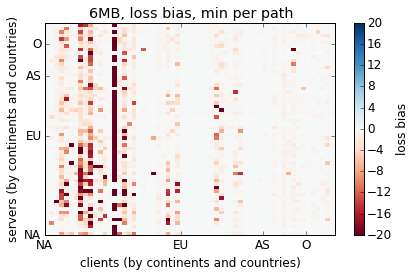

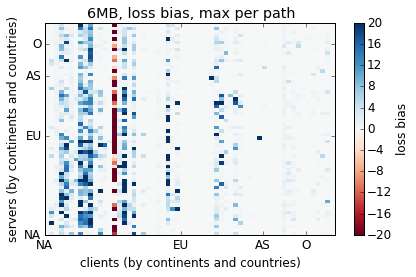

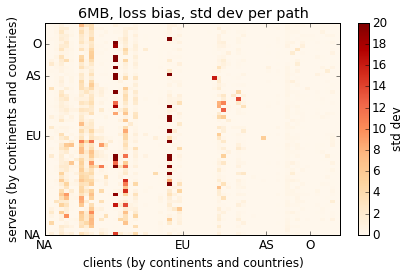

In [74]:
# Loss bias, per flow size
# mean, median, min, max, std dev, per path
cmap = "RdBu"
cmap2="OrRd"
for size in diff.copycatFileSize.unique():
    this_flowsize = diff[diff.copycatFileSize == size]
    size_label    = sizes[size]
    
    diff_grid(this_flowsize, "loss_adiff", np.mean, "mean", "{}, loss bias, mean per path".format(size_label), 
              vrange=[-20,20], zlegend="loss bias", cmap=cmap)
    diff_grid(this_flowsize, "loss_adiff", np.median, "median", "{}, loss bias, median per path".format(size_label), 
              vrange=[-20,20], zlegend="loss bias", cmap=cmap)
    diff_grid(this_flowsize, "loss_adiff", np.min, "amin", "{}, loss bias, min per path".format(size_label), 
              vrange=[-20,20], zlegend="loss bias", cmap=cmap)
    diff_grid(this_flowsize, "loss_adiff", np.max, "amax", "{}, loss bias, max per path".format(size_label), 
              vrange=[-20,20], zlegend="loss bias", cmap=cmap)
    diff_grid(this_flowsize, "loss_adiff", np.std, "std", "{}, loss bias, std dev per path".format(size_label), 
          vrange=[0,20], zlegend="std dev", cmap=cmap2)

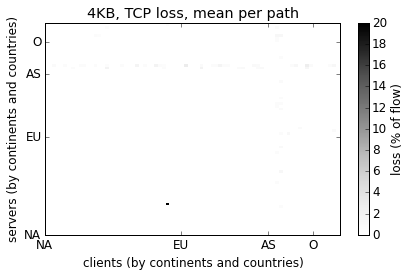

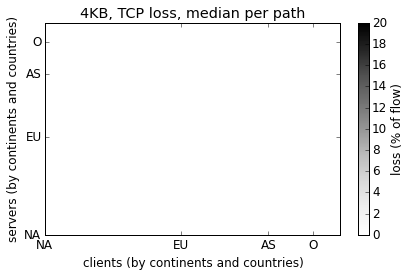

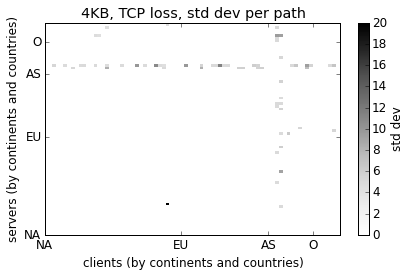

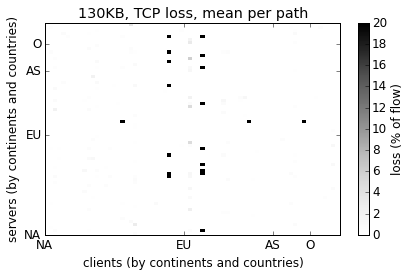

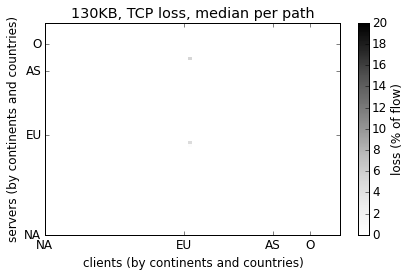

...

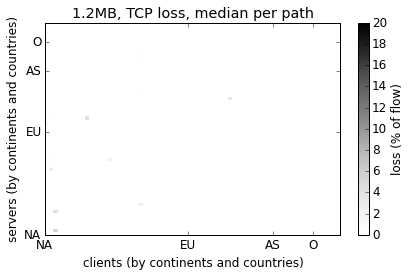

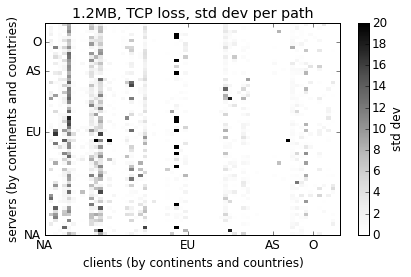

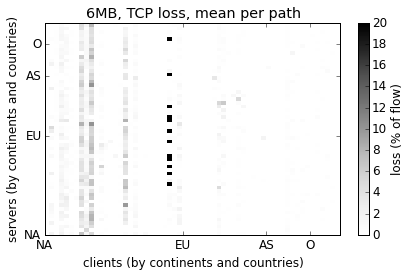

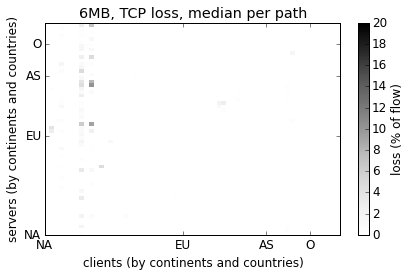

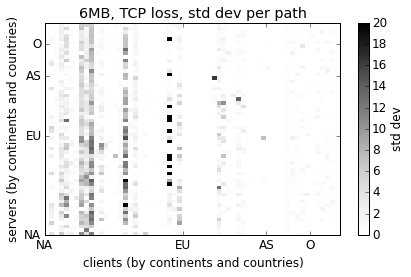

In [67]:
# TCP LOSS per flow size, all port together
cmap = "Greys"
for size in diff.copycatFileSize.unique():
    this_flowsize = diff[diff.copycatFileSize == size]
    size_label    = sizes[size]
    
    diff_grid(this_flowsize, "tcp_loss", np.mean, "mean", "{}, TCP loss, mean per path".format(size_label), 
              vrange=[0,20], zlegend="loss (% of flow)",cmap=cmap)
    diff_grid(this_flowsize, "tcp_loss", np.median, "median", "{}, TCP loss, median per path".format(size_label), 
              vrange=[0,20], zlegend="loss (% of flow)", cmap=cmap)
    diff_grid(this_flowsize, "tcp_loss", np.std, "std", "{}, TCP loss, std dev per path".format(size_label), 
          vrange=[0,20], zlegend="std dev", cmap=cmap)

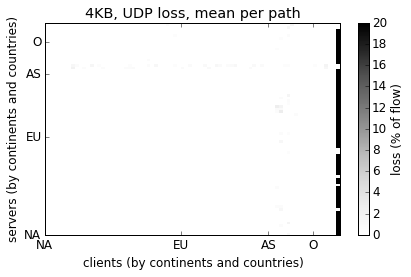

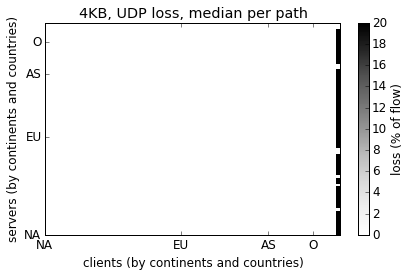

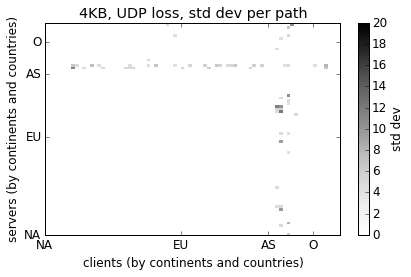

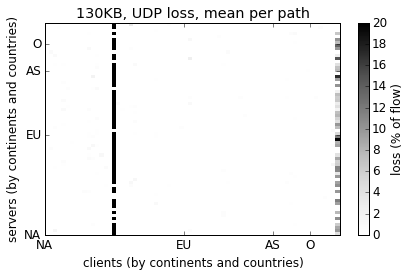

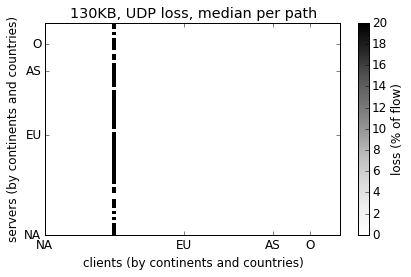

...

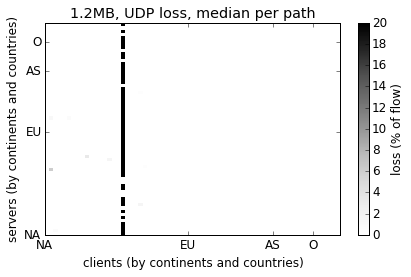

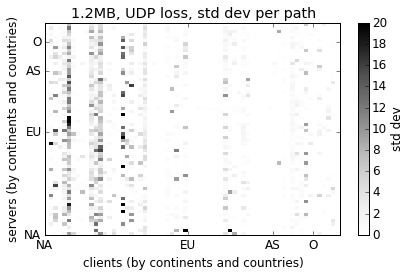

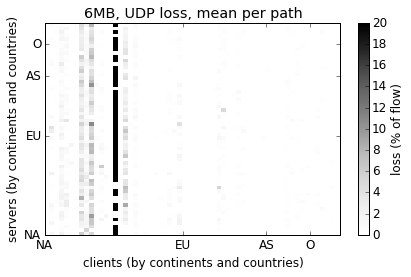

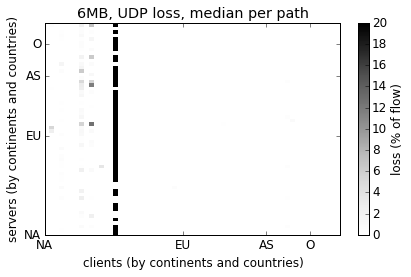

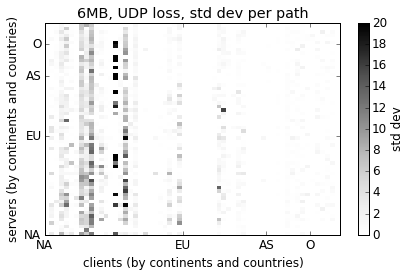

In [68]:
# UDP LOSS per flow size, all port together
cmap = "Greys"

for size in diff.copycatFileSize.unique():
    this_flowsize = diff[diff.copycatFileSize == size]
    size_label    = sizes[size]
    
    diff_grid(this_flowsize, "udp_loss", np.mean, "mean", "{}, UDP loss, mean per path".format(size_label), 
              vrange=[0,20], zlegend="loss (% of flow)",cmap=cmap)
    diff_grid(this_flowsize, "udp_loss", np.median, "median", "{}, UDP loss, median per path".format(size_label), 
              vrange=[0,20], zlegend="loss (% of flow)",cmap=cmap)
    diff_grid(this_flowsize, "udp_loss", np.std, "std", "{}, UDP loss, std dev per path".format(size_label), 
          vrange=[0,20], zlegend="std dev",cmap=cmap)

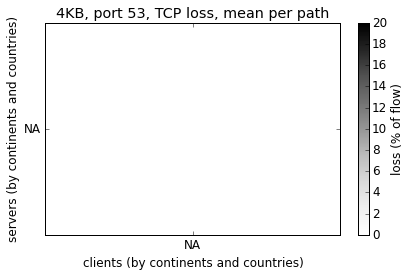

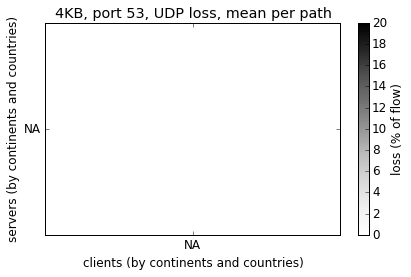

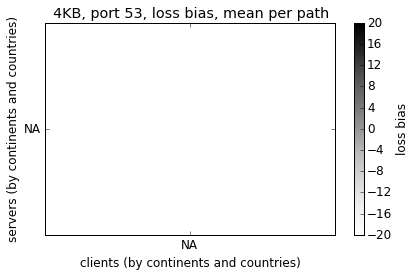

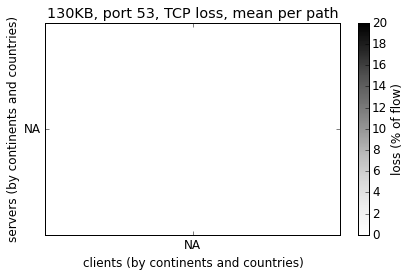

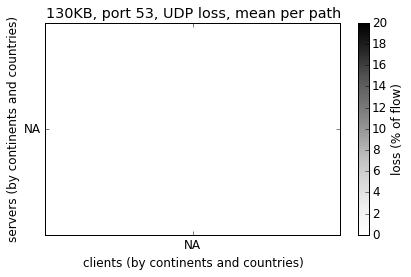

...

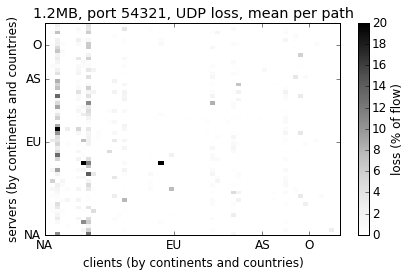

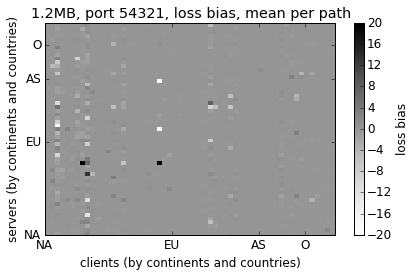

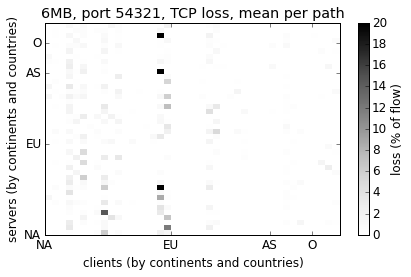

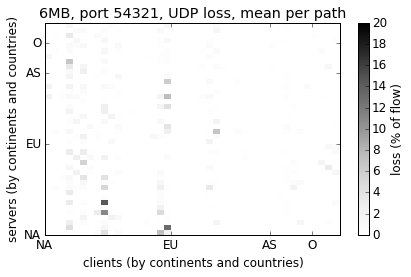

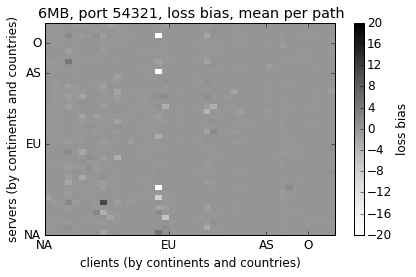

In [69]:
# tcp loss, udp loss & bias, MEAN per (port,flowsize) pair
# NOTE: there is a lot figures !
cmap = "Greys"
for port in ports:
    for size in diff.copycatFileSize.unique():
        this_flowsize = diff[(diff.copycatFileSize == size) & (diff.destinationTransportPort == port)]
        size_label    = sizes[size]

        diff_grid(this_flowsize, "tcp_loss", np.mean, "mean", 
                  "{}, port {}, TCP loss, mean per path".format(size_label, port), 
                  vrange=[0,20], zlegend="loss (% of flow)", cmap=cmap)
        diff_grid(this_flowsize, "udp_loss", np.mean, "mean", 
                  "{}, port {}, UDP loss, mean per path".format(size_label, port), 
                  vrange=[0,20], zlegend="loss (% of flow)",cmap=cmap)
        diff_grid(this_flowsize, "loss_adiff", np.mean, 
                  "mean", "{}, port {}, loss bias, mean per path".format(size_label, port), 
                  vrange=[-20,20], zlegend="loss bias",cmap=cmap)
    

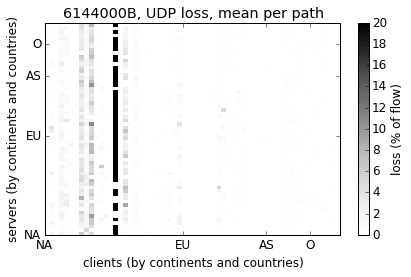

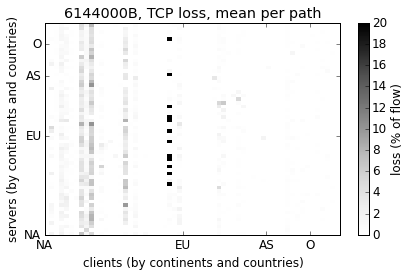

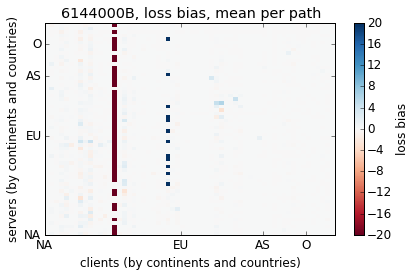

In [76]:
# loss grid for largest flow
save = False
fmt  = 'png'
size = 6144000
cmap = "Greys"
cmap2= "RdBu"
this_flowsize = diff[diff.copycatFileSize == size]
diff_grid(this_flowsize, "udp_loss", np.mean, "mean", "{}B, UDP loss, mean per path".format(size), 
              vrange=[0,20], zlegend="loss (% of flow)", cmap=cmap,
             file=output_dir+"loss-udp-mean."+fmt if save else None)
diff_grid(this_flowsize, "tcp_loss", np.mean, "mean", "{}B, TCP loss, mean per path".format(size), 
              vrange=[0,20], zlegend="loss (% of flow)",  cmap=cmap,
             file=output_dir+"loss-tcp-mean."+fmt if save else None)
diff_grid(this_flowsize, "loss_adiff", np.mean, "mean", "{}B, loss bias, mean per path".format(size), 
          vrange=[-20,20], zlegend="loss bias", cmap=cmap2,
          file=output_dir+"loss-diff-mean."+fmt if save else None)

#  

# Statistics

In [56]:

bw_mean,  bw_median  = diff.bw_rdiff.mean(), diff.bw_rdiff.median()
rtt_mean, rtt_median  = diff.rtt_rdiff.mean(), diff.rtt_rdiff.median()
loss_mean, loss_median  = diff.loss_adiff.mean(), diff.loss_adiff.median()
print("Total\nRTT  median:{0:.2f}%".format(rtt_median))
print("tput median:{0:.2f}%".format(bw_median))
print("loss median:{0:.2f}%".format(loss_median))
print()

for port in ports+[53,443]:
    this_diff = diff[diff.destinationTransportPort == port]
    
    bw_mean,  bw_median  = this_diff.bw_rdiff.mean(), this_diff.bw_rdiff.median()
    rtt_mean, rtt_median  = this_diff.rtt_rdiff.mean(), this_diff.rtt_rdiff.median()
    loss_mean, loss_median  = this_diff.loss_adiff.mean(), this_diff.loss_adiff.median()
    print("port {}".format(port))
    print("RTT  median:{0:.2f}%".format(rtt_median))
    print("tput median:{0:.2f}%".format(bw_median))
    print("loss median:{0:.2f}%".format(loss_median))
    print()
    
del this_diff

Total
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 53
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 443
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 8008
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 12345
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 33435
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 34567
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 54321
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 53
RTT  median:0.00%
tput median:0.05%
loss median:0.00%

port 443
RTT  median:0.00%
tput median:0.05%
loss median:0.00%



# Connectivity

In [73]:
# per path block rate, % of 3-tuples (src ip, dest ip, dest port) for which all UDP probe failed to connect
# but at least one TCP succeeded
def udp_blocked(l):
    return (1.0 not in l.values) and (-1.0 in l.values)

tcp.protocolIdentifier = pd.Series([-1.0]*len(tcp))
tcp.protocolIdentifier = tcp.protocolIdentifier.astype(float)
udp.protocolIdentifier = pd.Series([1.0]*len(udp))
udp.protocolIdentifier = udp.protocolIdentifier.astype(float)

conn = pd.concat([tcp, udp])
ind = ["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort"]
proto = "protocolIdentifier"
all_ies = ind + [proto]

conn = conn[all_ies].groupby(ind).agg(udp_blocked).reset_index()
conn_ports = []
for p in conn.destinationTransportPort.unique():
    if p == 443: # manually removing nodes with bind restrictions
        for d in [50, 71, 74]:
            conn = conn[~((conn.destinationTransportPort == p) & (conn.destinationIPv4Address == d))]
    if p == 53:
        for d in [25, 47, 55, 69, 63, 153, 12, 19, 44, 0]:
            conn = conn[~((conn.destinationTransportPort == p) & (conn.destinationIPv4Address == d))]
        for d in [25 , 47,54,55,87, 153, 12, 19, 44, 0]:
            conn = conn[~((conn.destinationTransportPort == p) & (conn.sourceIPv4Address == d))]

    this_conn = conn[(conn.destinationTransportPort == p) & (conn.sourceIPv4Address != 44)]
    if p == 33435:
        test = this_conn
    conn_bias = this_conn.protocolIdentifier.mean()*100.0
    print("{0} connectivity bias:{1:.2f}% ({2} paths)".format(p, conn_bias, len(this_conn)))
filter_flow = (conn.sourceIPv4Address != 44)
conn =  conn[filter_flow]
print("connectivity bias for all ports except 53,443: {0:.2f}% ({1} 3-tuples)".format(
        conn[(conn.destinationTransportPort != 443) & 
             (conn.destinationTransportPort != 53)].protocolIdentifier.mean()*100.0,
         len(conn)))


443 connectivity bias:4.12% (3034 paths)
8008 connectivity bias:2.60% (5307 paths)
12345 connectivity bias:2.45% (5233 paths)
33435 connectivity bias:2.77% (5309 paths)
34567 connectivity bias:2.44% (5115 paths)
54321 connectivity bias:3.07% (4951 paths)
53 connectivity bias:0.55% (1829 paths)
connectivity bias for all ports except 53,443: 2.66% (30778 3-tuples)



163088
443 connectivity bias:-7.27%
8008 connectivity bias:-4.21%
12345 connectivity bias:-1.21%
33435 connectivity bias:-5.00%
34567 connectivity bias:-5.39%
54321 connectivity bias:-5.63%
53 connectivity bias:-4.00%
connectivity bias for all ports except 53,443: -4.26%


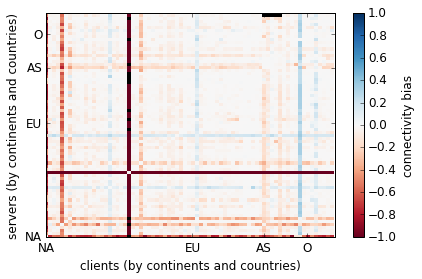

In [67]:
# connectivity bias
tcp.protocolIdentifier = pd.Series([-1.0]*len(tcp))
tcp.protocolIdentifier = tcp.protocolIdentifier.astype(float)
udp.protocolIdentifier = pd.Series([1.0]*len(udp))
udp.protocolIdentifier = udp.protocolIdentifier.astype(float)

conn = pd.concat([tcp, udp])
ind = ["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort",
       "copycatCampaignId"]
proto = "protocolIdentifier"
all_ies = ind + [proto]

conn = conn[all_ies].groupby(ind).agg(np.mean).reset_index()
conn_per_port = []
conn_ports = []
print(len(conn))
for p in conn.destinationTransportPort.unique():
    if p == 443: # manually removing nodes with bind restrictions
        for d in [50, 71, 74]:
            conn = conn[~((conn.destinationTransportPort == p) & (conn.destinationIPv4Address == d))]
    if p == 53:
        for d in [25, 47, 55, 69, 63, 153, 12, 19, 44, 0]:
            conn = conn[~((conn.destinationTransportPort == p) & (conn.destinationIPv4Address == d))]
        for d in [25 , 47,54,55,87, 153, 12, 19, 44, 0]:
            conn = conn[~((conn.destinationTransportPort == p) & (conn.sourceIPv4Address == d))]

    conn_bias = conn[(conn.destinationTransportPort == p) & (conn.sourceIPv4Address != 44)]
    conn_per_port.append(conn_bias)
    conn_ports.append(p)
    conn_bias = conn_bias.protocolIdentifier.mean()*100.0
    print("{0} connectivity bias:{1:.2f}%".format(p, conn_bias))

filter_flow = (conn.sourceIPv4Address != 44)
conn =  conn[filter_flow]
print("connectivity bias for all ports except 53,443: {0:.2f}%".format(
        conn[(conn.destinationTransportPort != 443) & 
             (conn.destinationTransportPort != 53)].protocolIdentifier.mean()*100.0))

save = False
fmt = 'pdf'
imp.reload(graph)
a=graph.diff_grid(conn, "protocolIdentifier", np.mean, "mean", "", 
              vrange=[-1,1], zlegend="connectivity bias", cmap="RdBu",
             file=output_dir+"conn-bias-test."+fmt if save else None, conn=True)

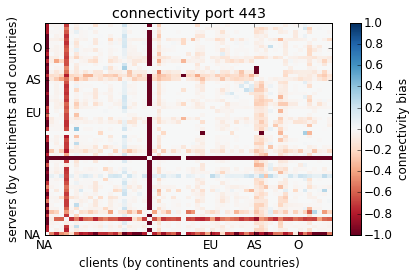

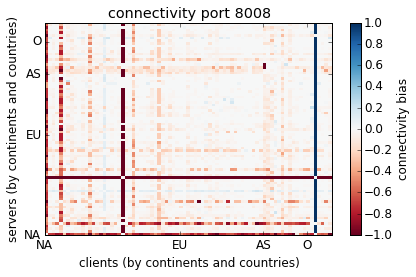

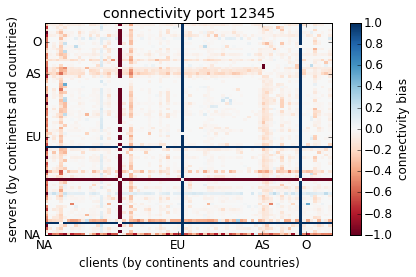

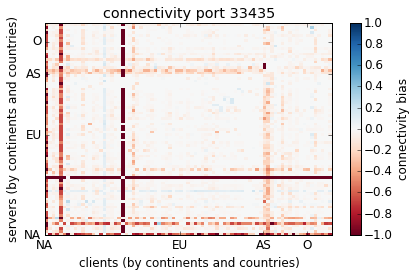

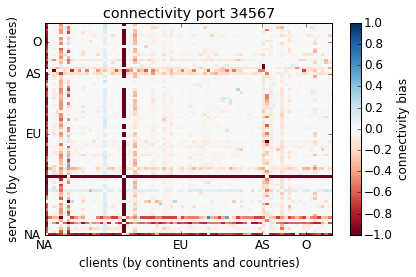

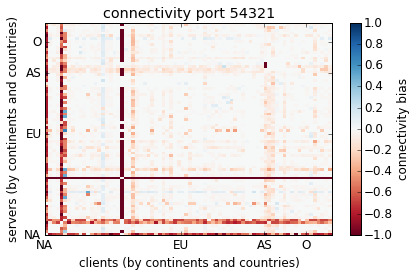

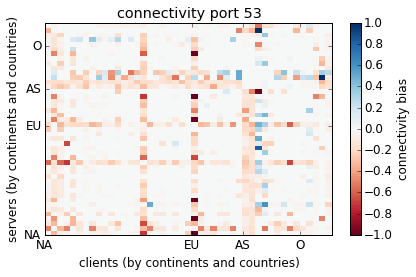

In [130]:
save = False
fmt = 'png'
imp.reload(graph)
for i, c in enumerate(conn_per_port):
    graph.diff_grid(c, "protocolIdentifier", np.mean, "mean", "connectivity port {}".format(conn_ports[i]), 
                  vrange=[-1,1], zlegend="connectivity bias", cmap="RdBu", 
                 file=output_dir+"conn-bias-{}.".format(conn_ports[i])+fmt if save else None

# Atlas

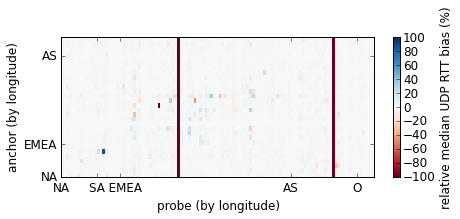

In [518]:
    import matplotlib.pyplot as plt

plt.figure(figsize=(7,2.5))
plt.pcolor((rtt_atlas.rtt_rdiff*100.0).unstack().fillna(0), 
           cmap="RdBu", vmin=-100, vmax=100)
plt.colorbar(label="relative median UDP RTT bias (%)")
plt.xlim(0,113)
plt.ylim(0,30)
plt.xticks((0,13,21,83,107),("NA", "SA   ", "   EMEA", "AS", "O")) 
plt.yticks((0,7,26),("NA", "EMEA", "AS")) 
plt.xlabel("probe (by longitude)")
plt.ylabel("anchor (by longitude)")
plt.savefig(output_dir+"/atlas_medrtt.png", bbox_inches="tight")

# Other